In [ ]:
#CELL 1- Run EnergyPATHWAYS scenarios directly from a Python Notebook

# ---------------------------------------------------------------------------
# This cell runs one or more EnergyPATHWAYS scenarios from Python, replicating
# the behaviour of the standard `start_runs.sh` shell script.
#
# Function:
# - Sets the working directory to a specific EnergyPATHWAYS scenario folder.
# - Defines a list of scenario cases that correspond to columns in runs_key.csv.
# - Converts high-level boolean options (load demand, export results, save
#   models) into the exact command-line flags expected by EnergyPATHWAYS.
# - Executes each scenario sequentially via the `energyPATHWAYS` CLI.
# - Assigns the shape engine to the first scenario only (`--shape_owner`) so
#   that daily/hourly shape generation and pickling are performed once and
#   reused by subsequent scenarios in the same run.
# - Streams stdout and stderr to the notebook in real time for transparent
#   monitoring and debugging.
#
# Outcome:
# - All specified scenarios are run in order using a shared shape cache.
# - Results are exported and model objects saved according to the flags above.
# - This provides a reproducible, notebook-friendly alternative to running
#   EnergyPATHWAYS from the command line or bash scripts.
# ---------------------------------------------------------------------------



import pkgutil, energyPATHWAYS

import os
import subprocess
import shlex

# -------------------------------------------------------
# 1. SET PATHS
# -------------------------------------------------------

scenario_folder = r"C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario"
os.chdir(scenario_folder)
print("Working directory:", os.getcwd())

# -------------------------------------------------------
# 2. CONFIGURE RUN PARAMETERS (same as start_runs.sh)
# -------------------------------------------------------

# Cases you want to run (must match column names in runs_key.csv)
case_list = [
    "reference",
    "eplus",
    "eplus reduce exports",
    "eminus"
]

ep_load_demand   = False
ep_export_results = True
ep_save_models    = True

# -------------------------------------------------------
# 3. Translate booleans → flags (exactly like the bash script)
# -------------------------------------------------------

load_demand_flag = "--load_demand" if ep_load_demand else "--no_load_demand"
export_flag      = "" if ep_export_results else "--no_export_results"
save_flag        = "" if ep_save_models else "--no_save_models"

# -------------------------------------------------------
# 4. Run each case sequentially (first case owns the shape engine)
# -------------------------------------------------------

first_case = True

for case in case_list:
    shape_flag = "--shape_owner" if first_case else "--no_shape_owner"
    first_case = False

    cmd = f'energyPATHWAYS -s "{case}" {load_demand_flag} {export_flag} {save_flag} {shape_flag}'
    print("\n====================================================")
    print("RUNNING:", cmd)
    print("====================================================")

    # Run the command and stream output
    process = subprocess.Popen(
        shlex.split(cmd),
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        text=True
    )

    for line in process.stdout:
        print(line, end="")

    process.wait()
    print(f"\nCASE COMPLETE: {case}\n")

print("All cases finished.")


Working directory: C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario

RUNNING: energyPATHWAYS -s "reference" --no_load_demand   --shape_owner
git branch name: main
git short commit: 279c617
git long commit: 279c617c57cf1abd6d66bd53f572b55ccd112a31
Demand primary geography is nzau-geography
Scenario run list: reference
Starting scenario reference
Start time 2025-12-16 00:22:28
Comparing shape pickles to ensure they are up to date...
Reading shape data:
Reading shape data: bulk_electricity | file: bulk_electricity.csv
Reading shape data: commercial_electricity | file: commercial_electricity.csv
Reading shape data: daily_clusters_bulk_electricity | file: daily_clusters_bulk_electricity.csv
Reading shape data: EV | file: EV.csv
Reading shape data: flat_demand_side | file: flat_demand_side.csv
Reading shape data: industry_electricity | file: industry_electricity.csv
Reading shape data: residential_electricity | file: residential_electricity.csv
Done.
('EV', 2018)...PASS
('flat_demand_side

['DEMAND_TECHNOLOGY', 'FINAL_ENERGY', 'NZAU-GEOGRAPHY', 'OTHER_INDEX_1', 'SCENARIO', 'SECTOR', 'SUBSECTOR', 'UNIT', 'YEAR', 'VALUE']


,DEMAND_TECHNOLOGY,FINAL_ENERGY,NZAU-GEOGRAPHY,OTHER_INDEX_1,SCENARIO,SECTOR,SUBSECTOR,UNIT,YEAR,VALUE
0,CFL Exterior,electricity,ex-nsw,not applicable,REFERENCE,residential,residential lighting,gigajoule,2018,0.0
1,CFL Exterior,electricity,ex-nsw,not applicable,REFERENCE,residential,residential lighting,gigajoule,2019,0.0
2,CFL Exterior,electricity,ex-nsw,not applicable,REFERENCE,residential,residential lighting,gigajoule,2020,0.0
3,CFL Exterior,electricity,ex-nsw,not applicable,REFERENCE,residential,residential lighting,gigajoule,2021,0.0
4,CFL Exterior,electricity,ex-nsw,not applicable,REFERENCE,residential,residential lighting,gigajoule,2022,0.0


,YEAR,VALUE
0,2018,7.791120e+08
1,2019,7.864893e+08
2,2020,7.943971e+08
3,2021,8.047734e+08
4,2022,8.153479e+08


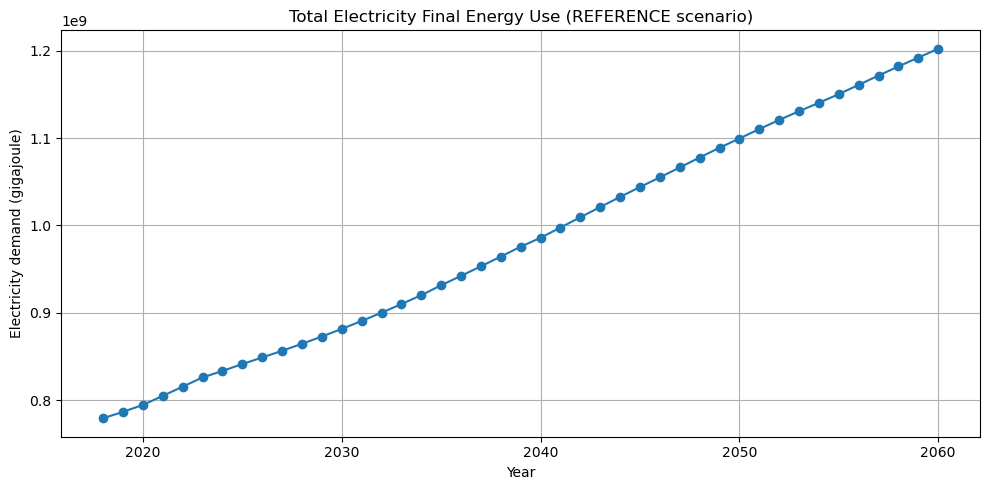

In [ ]:
#CELL 2 — Load annual energy and plot total electricity demand

"""
Load EnergyPATHWAYS demand output, isolate electricity final energy use, 
aggregate total electricity demand by year, and plot the annual time series 
for the REFERENCE scenario.

Steps:
1. Read compressed demand output CSV.
2. Filter rows where FINAL_ENERGY == 'electricity'.
3. Sum electricity demand (VALUE) by YEAR.
4. Plot annual total electricity demand with units from the dataset.
"""



import pandas as pd
import matplotlib.pyplot as plt

# Load demand output
path = r"C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario\reference\demand_outputs\d_energy.csv.gz"
df = pd.read_csv(path)
print(df.columns.tolist())
display(df.head())

# Filter final energy = electricity
elec = df[df["FINAL_ENERGY"].str.lower() == "electricity"]

# Aggregate total electricity demand by year
annual_elec = elec.groupby("YEAR")["VALUE"].sum().reset_index()

display(annual_elec.head())

# Plot
plt.figure(figsize=(10,5))
plt.plot(annual_elec["YEAR"], annual_elec["VALUE"], marker="o")
plt.title("Total Electricity Final Energy Use (REFERENCE scenario)")
plt.xlabel("Year")
plt.ylabel(f"Electricity demand ({df['UNIT'].iloc[0]})")
plt.grid(True)
plt.tight_layout()
plt.show()


Rows returned: 8760


,NZAU-GEOGRAPHY,SCENARIO,SECTOR,SUBSECTOR,WEATHER_DATETIME,YEAR,GIGAJOULE
13367760,nsw-north,REFERENCE,residential,residential lighting,2018-01-01 00:00:00,2021,149.535067
13367765,nsw-north,REFERENCE,residential,residential lighting,2018-01-01 01:00:00,2021,149.535084
13367770,nsw-north,REFERENCE,residential,residential lighting,2018-01-01 02:00:00,2021,149.535096
13367775,nsw-north,REFERENCE,residential,residential lighting,2018-01-01 03:00:00,2021,149.535106
13367780,nsw-north,REFERENCE,residential,residential lighting,2018-01-01 04:00:00,2021,149.535114


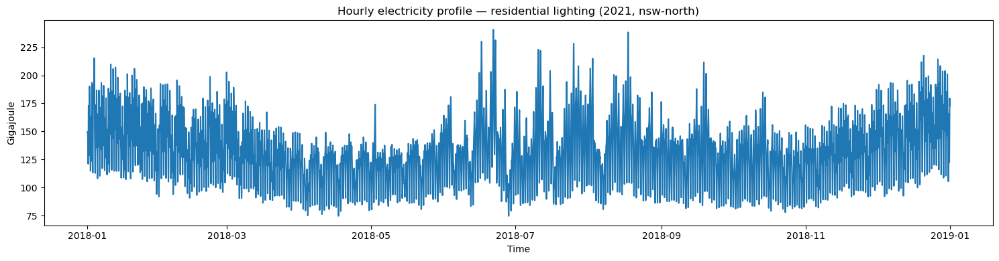

In [ ]:
#CELL 3 — Plot hourly shape for a single subsector

#For example “residential lighting”, year 2021.


import pandas as pd
import matplotlib.pyplot as plt

path = r"C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario\reference\demand_outputs\subsector_electricity_profiles.csv.gz"

# Load (slow — file is large)
df = pd.read_csv(path)

# Choose subsector + year
sub = "residential lighting"
yr = 2021
region = "nsw-north"   # can adjust or remove if you want all regions

# Filter
subset = df[
    (df["SUBSECTOR"] == sub) &
    (df["YEAR"] == yr) &
    (df["NZAU-GEOGRAPHY"] == region)
].copy()

print("Rows returned:", len(subset))
display(subset.head())

# Convert timestamp
subset["WEATHER_DATETIME"] = pd.to_datetime(subset["WEATHER_DATETIME"])

# Plot
plt.figure(figsize=(15,4))
plt.plot(subset["WEATHER_DATETIME"], subset["GIGAJOULE"])
plt.title(f"Hourly electricity profile — {sub} ({yr}, {region})")
plt.xlabel("Time")
plt.ylabel("Gigajoule")
plt.tight_layout()
plt.show()



Rows after subsector/year/region filter: 8760
Rows after WEATHER day filter: 24


,NZAU-GEOGRAPHY,SCENARIO,SECTOR,SUBSECTOR,WEATHER_DATETIME,YEAR,GIGAJOULE
13367760,nsw-north,REFERENCE,residential,residential lighting,2018-01-01 00:00:00,2021,149.535067
13367765,nsw-north,REFERENCE,residential,residential lighting,2018-01-01 01:00:00,2021,149.535084
13367770,nsw-north,REFERENCE,residential,residential lighting,2018-01-01 02:00:00,2021,149.535096
13367775,nsw-north,REFERENCE,residential,residential lighting,2018-01-01 03:00:00,2021,149.535106
13367780,nsw-north,REFERENCE,residential,residential lighting,2018-01-01 04:00:00,2021,149.535114


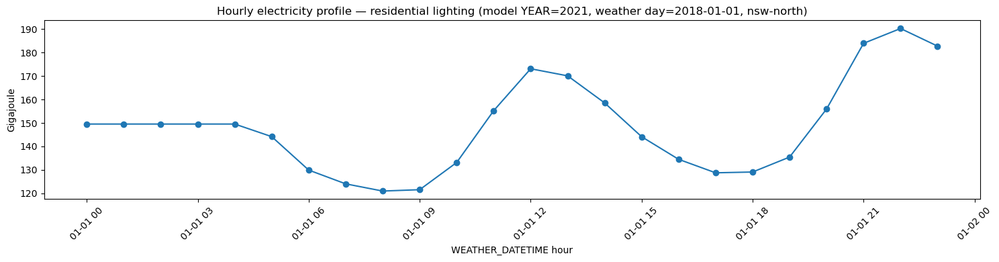

In [ ]:
# CELL 4 — Plot hourly shape for a single subsector on a single day
# NOTE: WEATHER_DATETIME is a "weather year" timestamp (often 2018) even when YEAR is 2021/2030/etc.
# So: pick the day using WEATHER_DATETIME (2018-..), and pick the modeled year using YEAR.

#####################################################################################
# NOTE - THIS CELL GAVE AN HOURLY PROFILE THAT APPEARS INCORRECT
# ANALYSES NEED TO BE RERUN WITH CORRECT TIMEZONE SETTINGS F0R EACH GAU
#####################################################################################

import pandas as pd
import matplotlib.pyplot as plt

path = r"C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario\reference\demand_outputs\subsector_electricity_profiles.csv.gz"

df = pd.read_csv(path)

# Choose modeled year + subsector + region
sub    = "residential lighting"
yr     = 2021
region = "nsw-north"

# Choose the day in the WEATHER year (typically 2018)
weather_day = "2018-01-01"   # YYYY-MM-DD in WEATHER_DATETIME

# Filter by subsector / year / region
subset = df[
    (df["SUBSECTOR"] == sub) &
    (df["YEAR"] == yr) &
    (df["NZAU-GEOGRAPHY"] == region)
].copy()

print("Rows after subsector/year/region filter:", len(subset))

# Convert timestamp
subset["WEATHER_DATETIME"] = pd.to_datetime(subset["WEATHER_DATETIME"])

# Filter to a single WEATHER day (00:00 to < next day)
day_start = pd.to_datetime(weather_day)
day_end   = day_start + pd.Timedelta(days=1)

subset_day = subset[
    (subset["WEATHER_DATETIME"] >= day_start) &
    (subset["WEATHER_DATETIME"] < day_end)
].copy()

print("Rows after WEATHER day filter:", len(subset_day))
display(subset_day.head())

# Plot
plt.figure(figsize=(15,4))
plt.plot(subset_day["WEATHER_DATETIME"], subset_day["GIGAJOULE"], marker="o")
plt.title(f"Hourly electricity profile — {sub} (model YEAR={yr}, weather day={weather_day}, {region})")
plt.xlabel("WEATHER_DATETIME hour")
plt.ylabel("Gigajoule")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



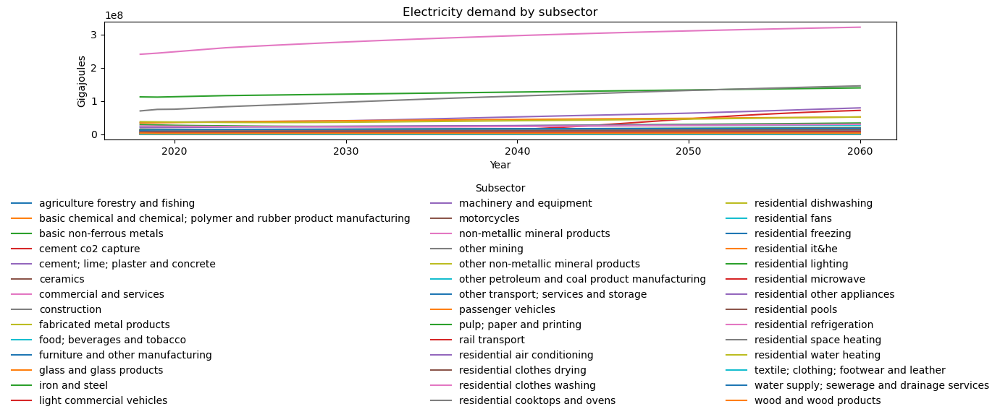

In [ ]:
#CELL 5 — Sectoral electricity demand breakdown


import pandas as pd
import matplotlib.pyplot as plt

path = r"C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario\reference\demand_outputs\d_energy.csv.gz"

df = pd.read_csv(path)

# Filter electricity only
elec = df[df["FINAL_ENERGY"] == "electricity"]

# Aggregate by subsector + year
sector_elec = (
    elec.groupby(["SUBSECTOR", "YEAR"])["VALUE"]
    .sum()
    .reset_index()
)

# Pivot to wide format
pivot = sector_elec.pivot(index="YEAR", columns="SUBSECTOR", values="VALUE")

# Plot with legend BELOW the plot
ax = pivot.plot(figsize=(14,7))

plt.title("Electricity demand by subsector")
plt.ylabel("Gigajoules")
plt.xlabel("Year")

# Place legend below
plt.legend(
    title="Subsector",
    bbox_to_anchor=(0.5, -0.3),   # centered under plot
    loc="upper center",
    ncol=3,                       # adjust number of columns as needed
    frameon=False
)

plt.tight_layout()
plt.show()




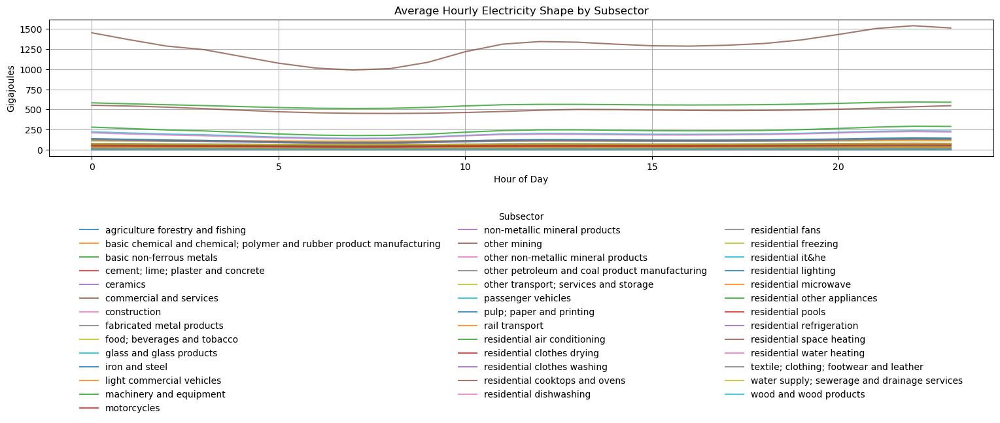

In [ ]:
#CELL 6 — Plot hourly electricity shapes for all subsectors


import pandas as pd
import matplotlib.pyplot as plt

# Load hourly subsector profiles
path = r"C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario\reference\demand_outputs\subsector_electricity_profiles.csv.gz"
df = pd.read_csv(path)

# Convert WEATHER_DATETIME → pandas datetime
df["WEATHER_DATETIME"] = pd.to_datetime(df["WEATHER_DATETIME"])

# Extract hour-of-day (0–23)
df["HOUR"] = df["WEATHER_DATETIME"].dt.hour

# Compute average hourly profile per subsector
hourly_shapes = (
    df.groupby(["SUBSECTOR", "HOUR"])["GIGAJOULE"]
      .mean()
      .reset_index()
)

# Pivot to wide format: HOUR as index, each subsector as a column
pivot = hourly_shapes.pivot(index="HOUR", columns="SUBSECTOR", values="GIGAJOULE")

# Plot all subsector hourly profiles
plt.figure(figsize=(16,8))
pivot.plot(ax=plt.gca(), alpha=0.8)

plt.title("Average Hourly Electricity Shape by Subsector")
plt.xlabel("Hour of Day")
plt.ylabel("Gigajoules")
plt.grid(True)

# Put legend below the plot
plt.legend(
    title="Subsector",
    bbox_to_anchor=(0.5, -0.35),
    loc="upper center",
    ncol=3,
    frameon=False
)

plt.tight_layout()
plt.show()


Residential subsectors included:
['residential air conditioning', 'residential clothes drying', 'residential clothes washing', 'residential cooktops and ovens', 'residential dishwashing', 'residential fans', 'residential freezing', 'residential it&he', 'residential lighting', 'residential microwave', 'residential other appliances', 'residential pools', 'residential refrigeration', 'residential space heating', 'residential water heating']

Plotting residential hourly shapes for GAU=ex-nsw
Years: [2021, 2030, 2040, 2050, 2060]


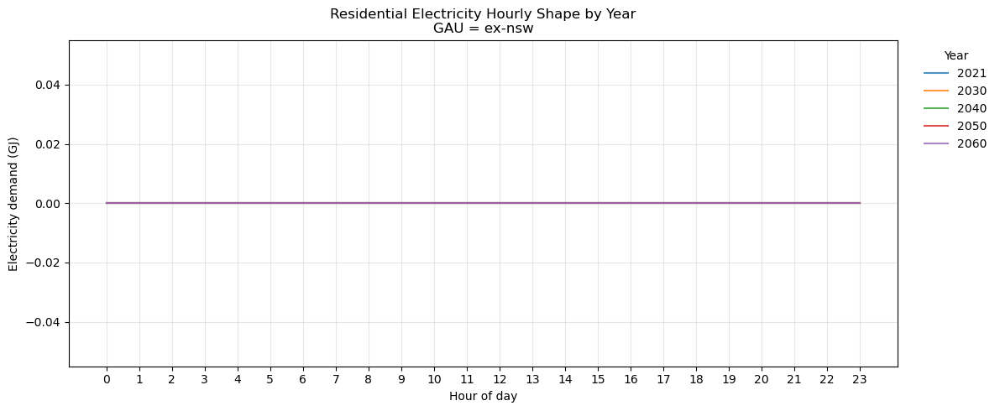


Plotting residential hourly shapes for GAU=ex-nt
Years: [2021, 2030, 2040, 2050, 2060]


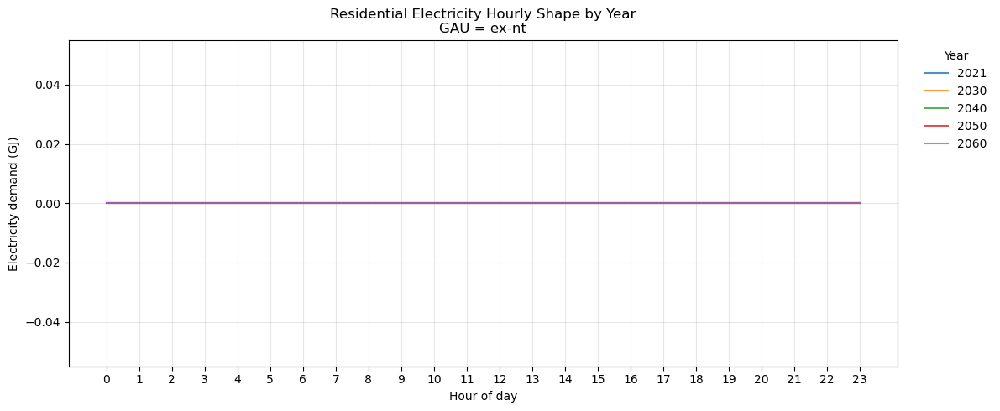


Plotting residential hourly shapes for GAU=ex-qld
Years: [2021, 2030, 2040, 2050, 2060]


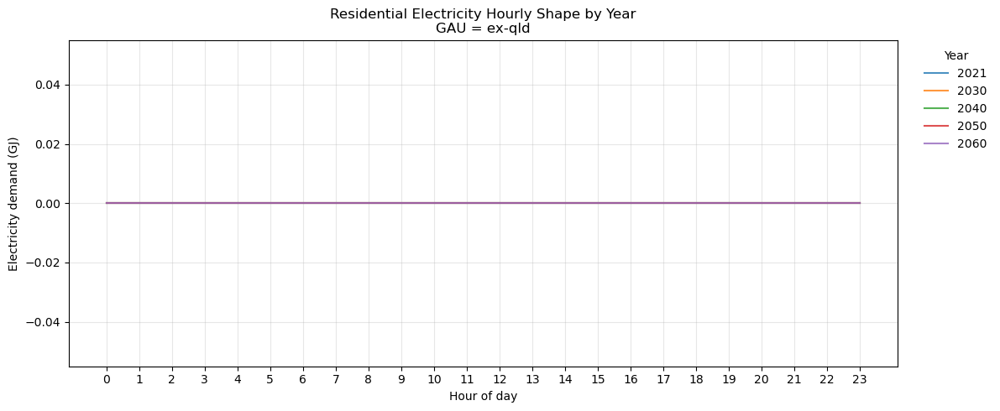


Plotting residential hourly shapes for GAU=ex-sa
Years: [2021, 2030, 2040, 2050, 2060]


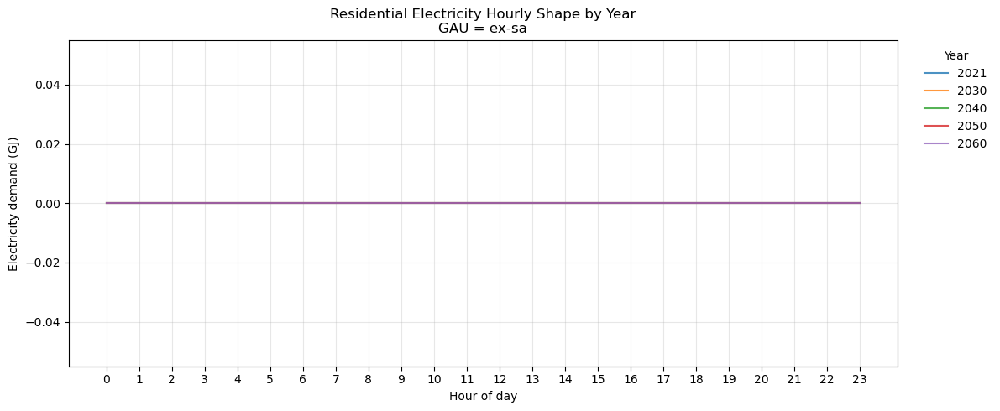


Plotting residential hourly shapes for GAU=ex-wa
Years: [2021, 2030, 2040, 2050, 2060]


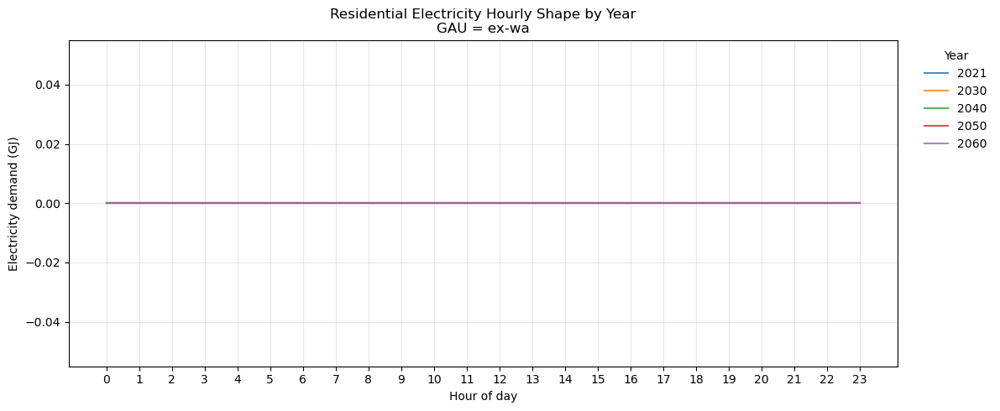


Plotting residential hourly shapes for GAU=export
Years: [2021, 2030, 2040, 2050, 2060]


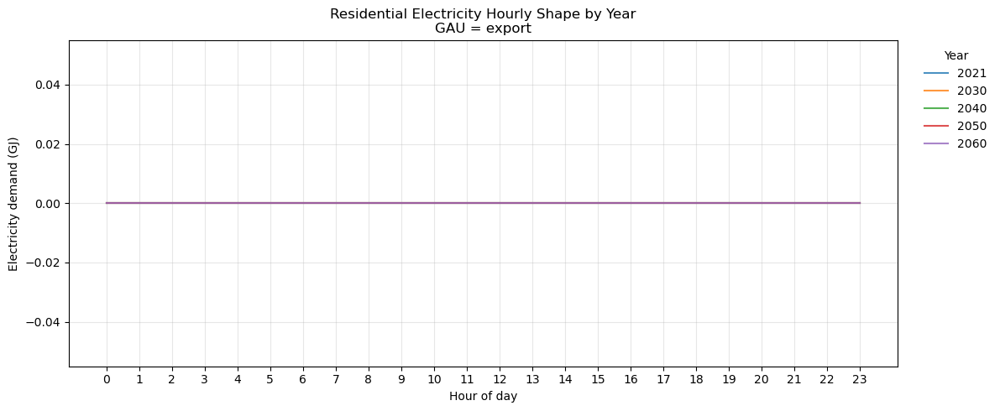


Plotting residential hourly shapes for GAU=nsw-central
Years: [2021, 2030, 2040, 2050, 2060]


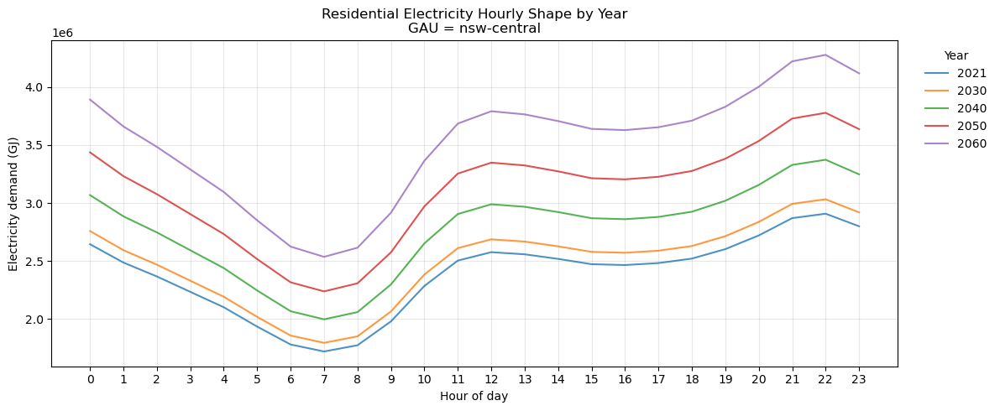


Plotting residential hourly shapes for GAU=nsw-north
Years: [2021, 2030, 2040, 2050, 2060]


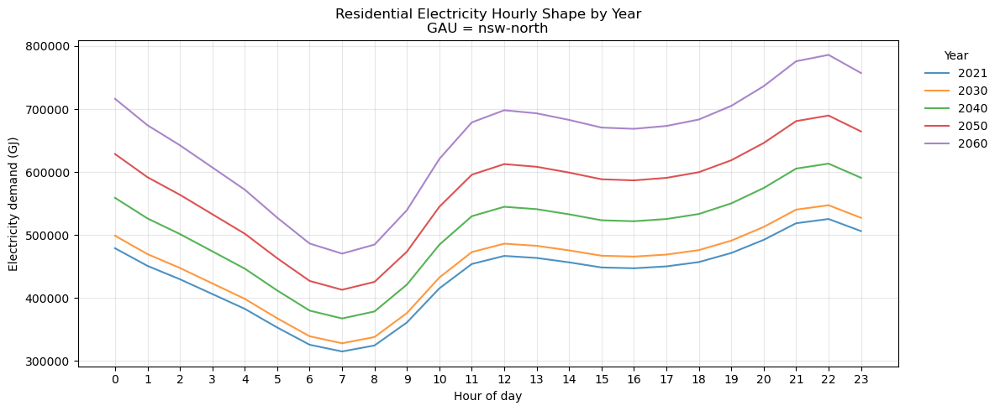


Plotting residential hourly shapes for GAU=nsw-outback
Years: [2021, 2030, 2040, 2050, 2060]


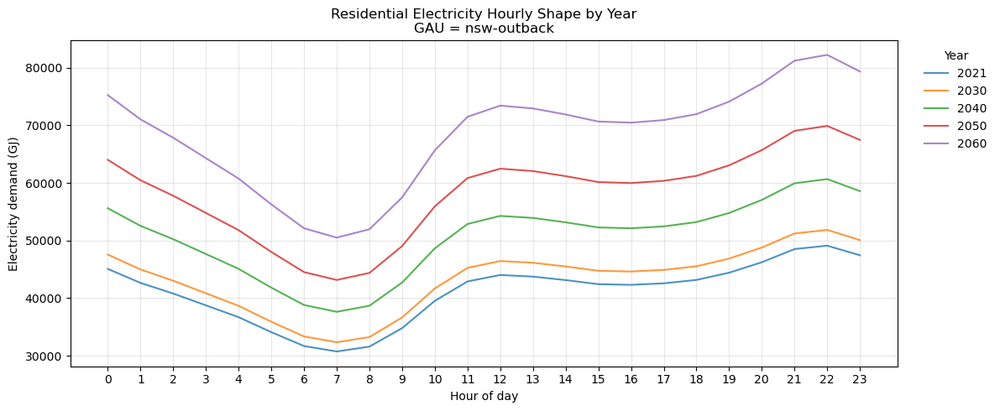


Plotting residential hourly shapes for GAU=nsw-south
Years: [2021, 2030, 2040, 2050, 2060]


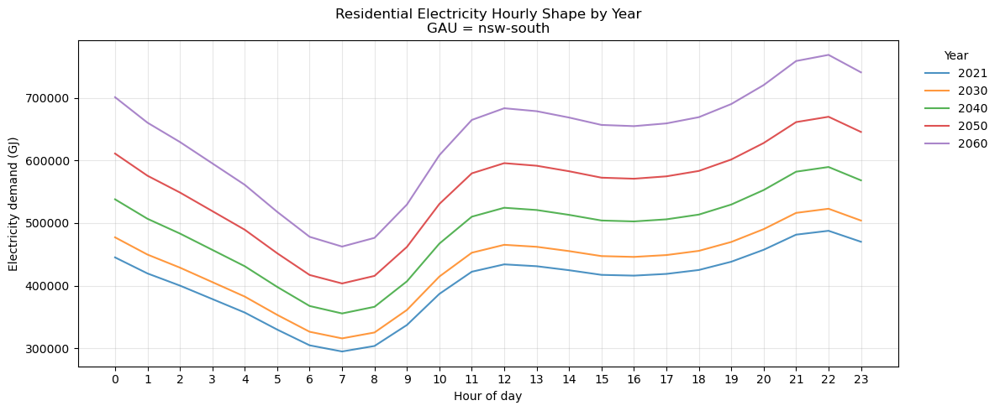


Plotting residential hourly shapes for GAU=nt
Years: [2021, 2030, 2040, 2050, 2060]


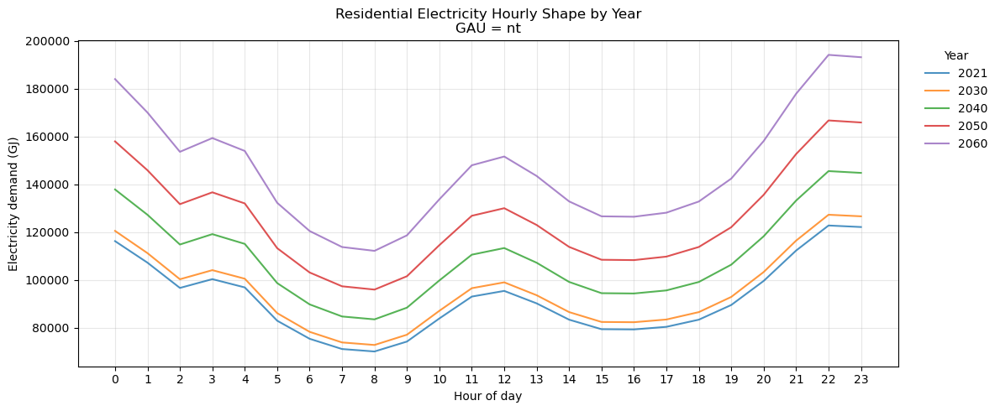


Plotting residential hourly shapes for GAU=port-nsw
Years: [2021, 2030, 2040, 2050, 2060]


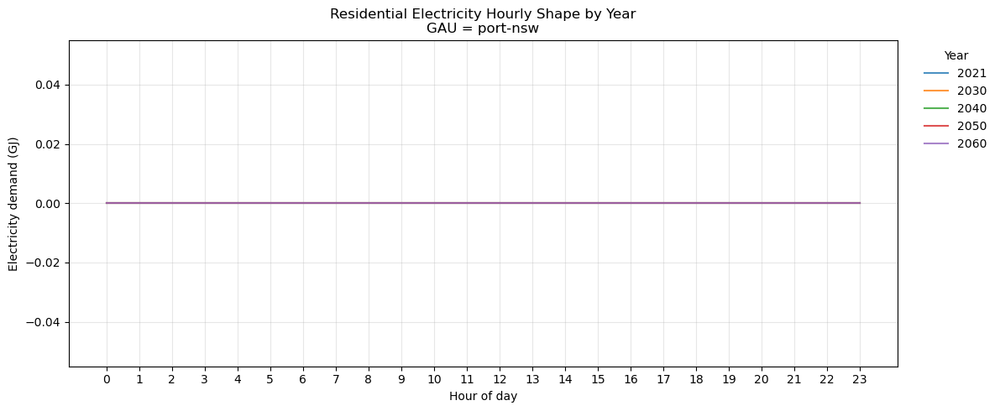


Plotting residential hourly shapes for GAU=port-nt
Years: [2021, 2030, 2040, 2050, 2060]


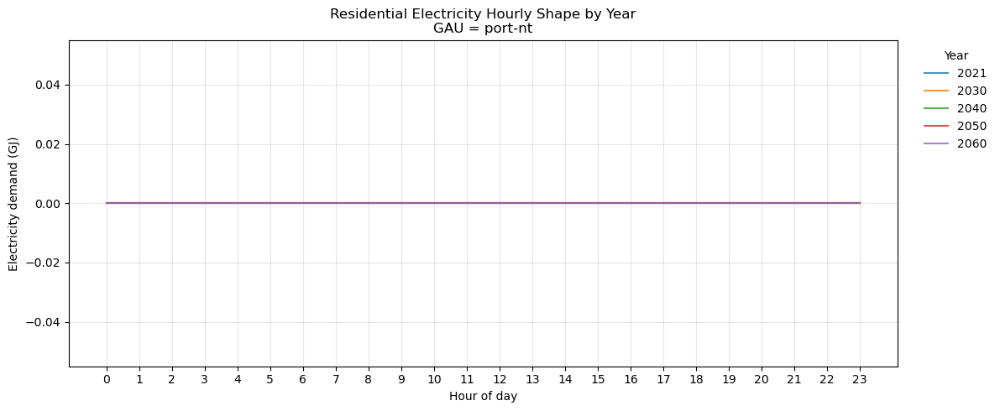


Plotting residential hourly shapes for GAU=port-qld
Years: [2021, 2030, 2040, 2050, 2060]


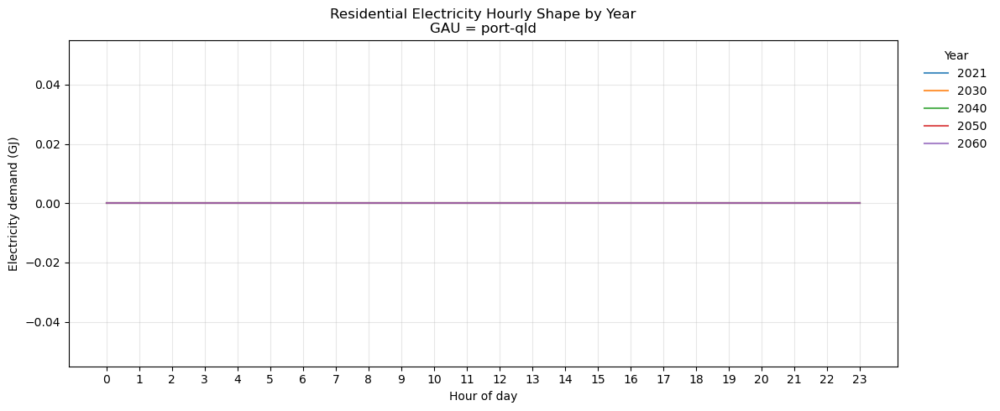


Plotting residential hourly shapes for GAU=port-sa
Years: [2021, 2030, 2040, 2050, 2060]


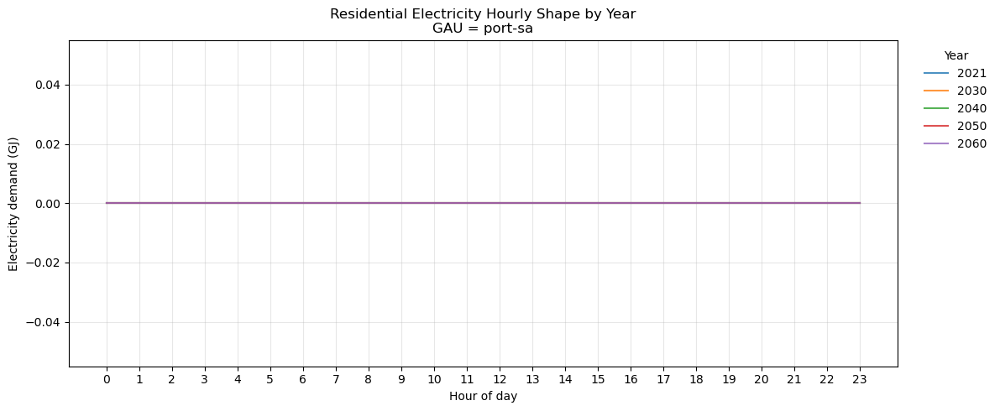


Plotting residential hourly shapes for GAU=port-wa
Years: [2021, 2030, 2040, 2050, 2060]


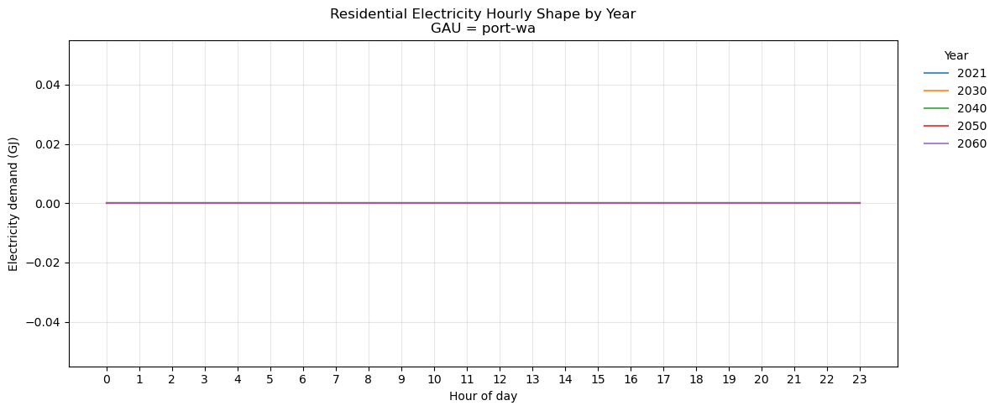


Plotting residential hourly shapes for GAU=qld-north
Years: [2021, 2030, 2040, 2050, 2060]


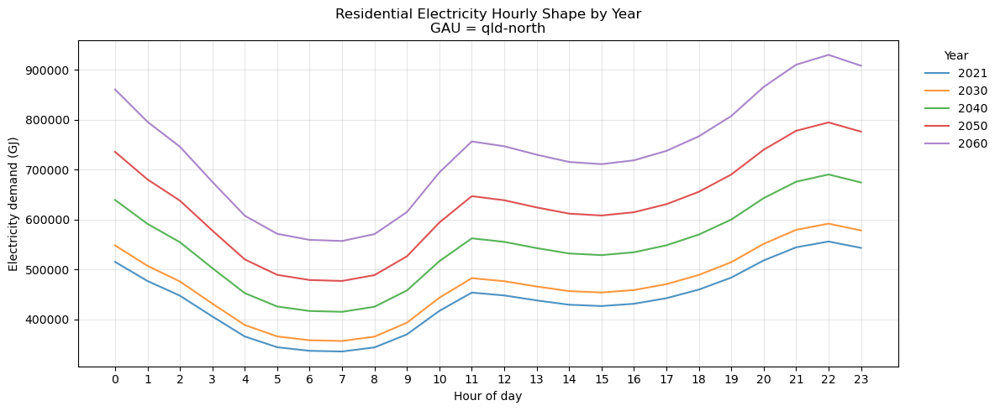


Plotting residential hourly shapes for GAU=qld-outback
Years: [2021, 2030, 2040, 2050, 2060]


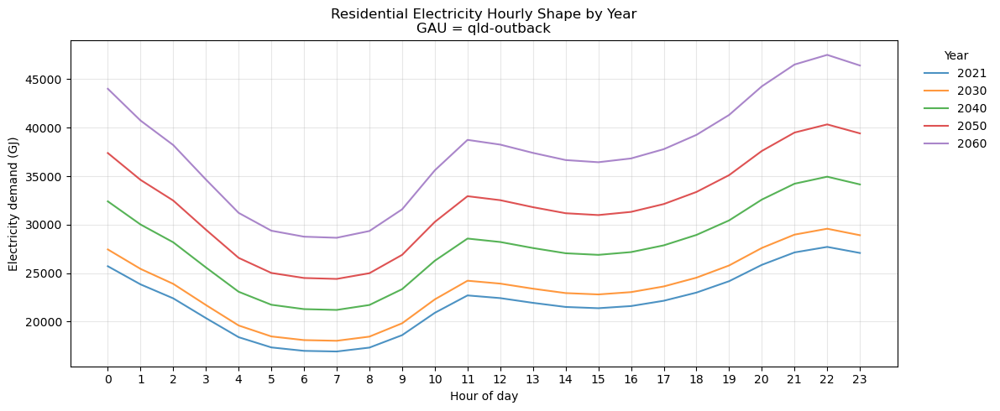


Plotting residential hourly shapes for GAU=qld-south
Years: [2021, 2030, 2040, 2050, 2060]


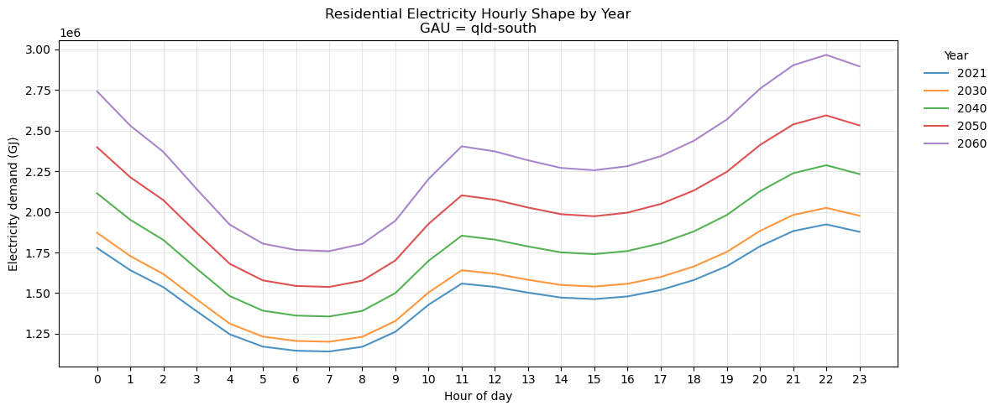


Plotting residential hourly shapes for GAU=sa
Years: [2021, 2030, 2040, 2050, 2060]


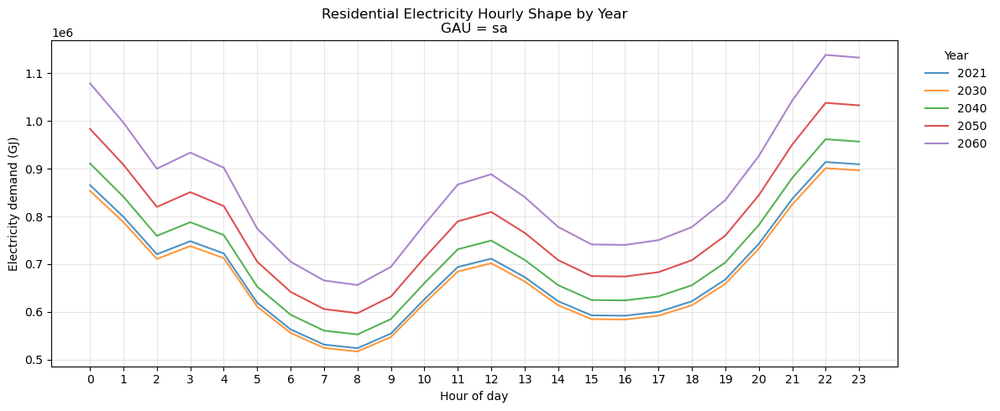


Plotting residential hourly shapes for GAU=tas
Years: [2021, 2030, 2040, 2050, 2060]


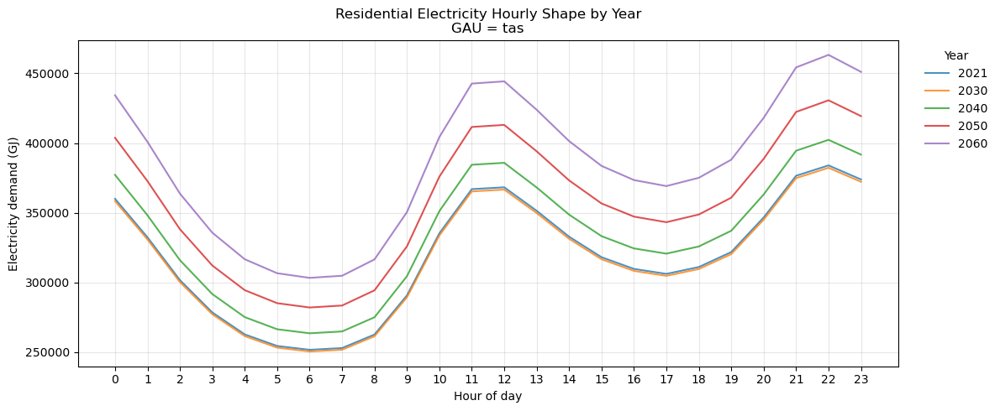


Plotting residential hourly shapes for GAU=vic-east
Years: [2021, 2030, 2040, 2050, 2060]


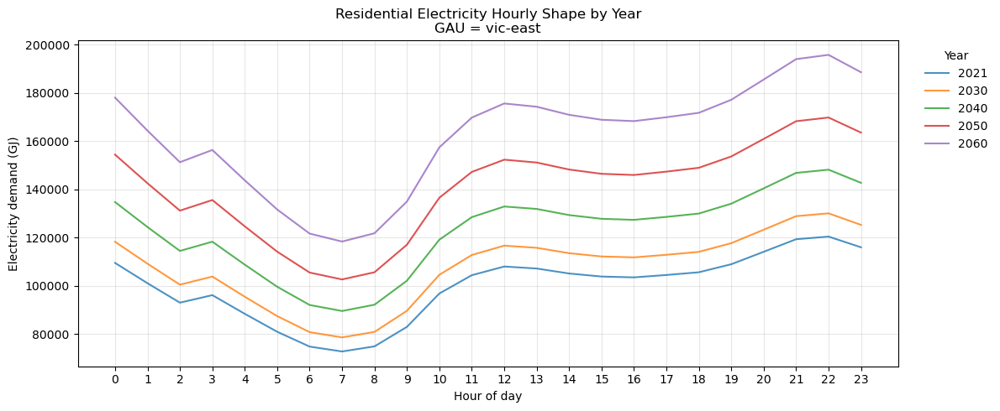


Plotting residential hourly shapes for GAU=vic-west
Years: [2021, 2030, 2040, 2050, 2060]


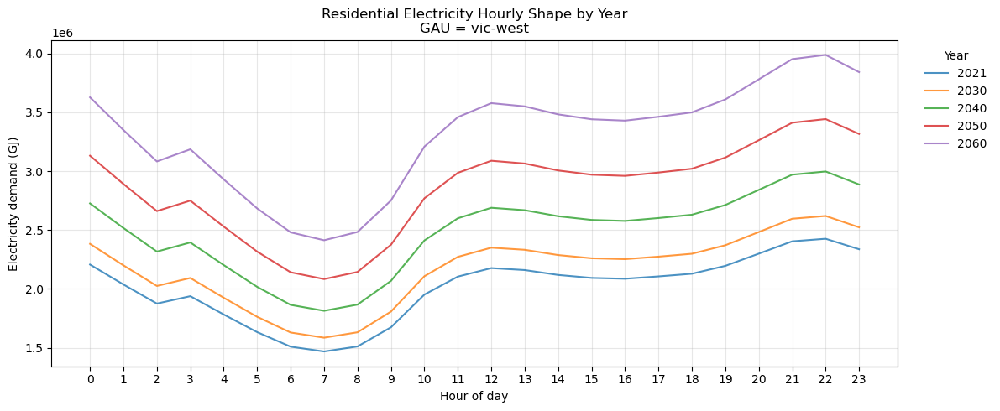


Plotting residential hourly shapes for GAU=wa-central
Years: [2021, 2030, 2040, 2050, 2060]


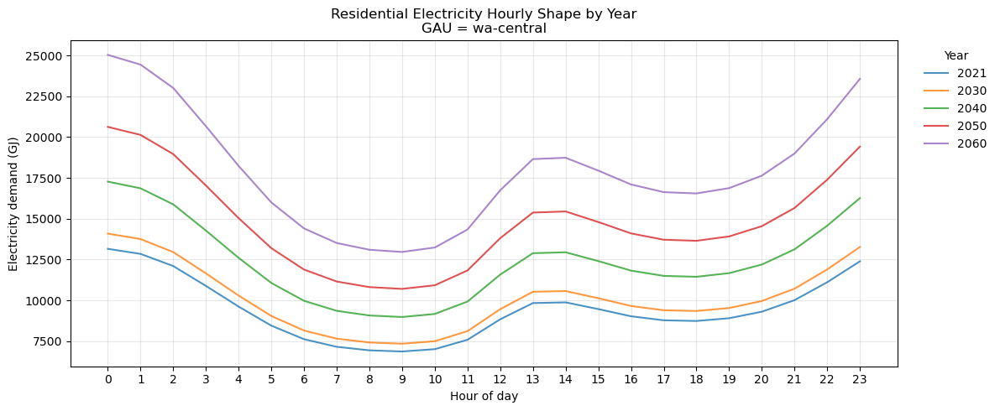


Plotting residential hourly shapes for GAU=wa-north
Years: [2021, 2030, 2040, 2050, 2060]


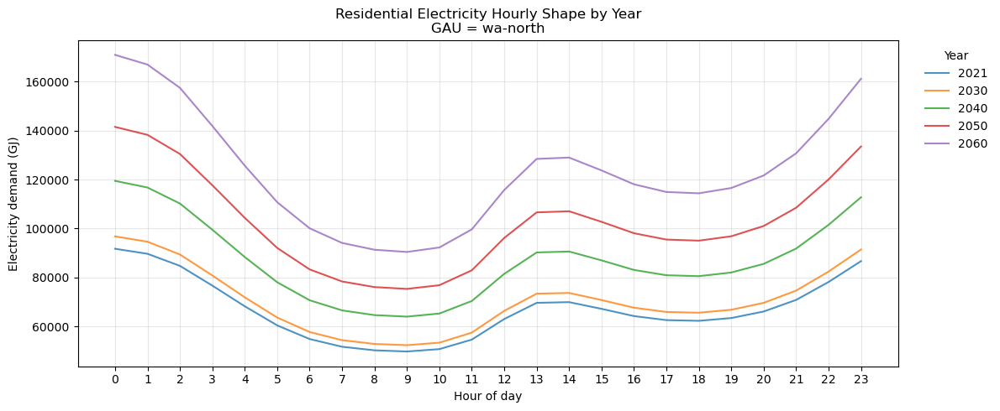


Plotting residential hourly shapes for GAU=wa-south
Years: [2021, 2030, 2040, 2050, 2060]


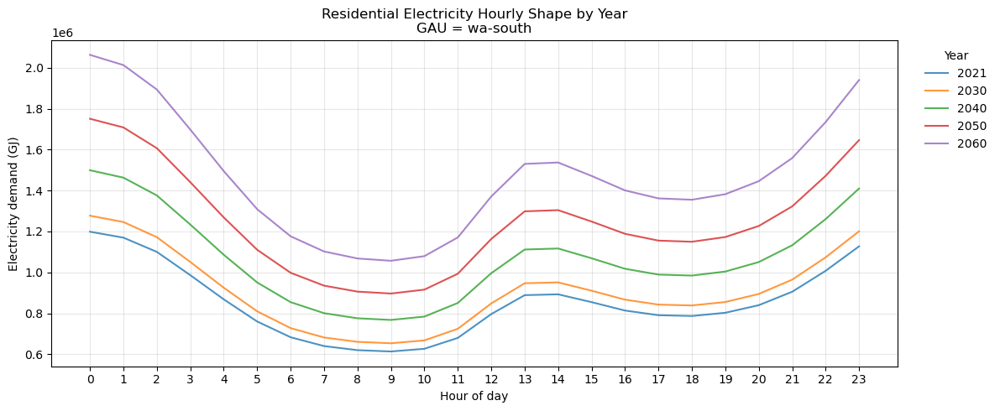

In [ ]:
# CELL 7 - Plot hourly electricity shapes for combined residential subsectors FOR 2021-2060
# showing all years on each plot, grouped by GAU

#####################################################################################
# NOTE - THIS CELL GIVES HOURLY SHAPES THAT INTUITIVELY APPEAR INCORRECT AND IT IS OBVIOUS THAT SOME GAU HAVE NO OUTPUT DATA
# ANALYSES NEED TO BE RERUN WITH CORRECT TIMEZONE SETTINGS F0R EACH GAU
# OVERALL ANNUAL DEMAND INCREASES FROM 2021-2060 AS EXPECTED
#####################################################################################

import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# LOAD DATA
# ------------------------------------------------------------
path = r"C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario\reference\demand_outputs\subsector_electricity_profiles.csv.gz"
df = pd.read_csv(path)

# Convert datetime
df["WEATHER_DATETIME"] = pd.to_datetime(df["WEATHER_DATETIME"])

# Extract hour-of-day
df["HOUR"] = df["WEATHER_DATETIME"].dt.hour

# ------------------------------------------------------------
# FILTER TO RESIDENTIAL SUBSECTORS
# ------------------------------------------------------------
res_df = df[df["SUBSECTOR"].str.startswith("residential", na=False)].copy()

print("Residential subsectors included:")
print(sorted(res_df["SUBSECTOR"].unique()))

# ------------------------------------------------------------
# AGGREGATE: residential total per GAU / YEAR / HOUR
# ------------------------------------------------------------
hourly_shapes = (
    res_df
    .groupby(
        ["NZAU-GEOGRAPHY", "YEAR", "HOUR"],
        as_index=False
    )["GIGAJOULE"]
    .sum()
)

# ------------------------------------------------------------
# PLOT: one figure per GAU, all years overlaid
# ------------------------------------------------------------
for gau, sub in hourly_shapes.groupby("NZAU-GEOGRAPHY"):

    years = sorted(sub["YEAR"].unique())
    print(f"\nPlotting residential hourly shapes for GAU={gau}")
    print("Years:", years)

    plt.figure(figsize=(12, 5))

    for year in years:
        yr = sub[sub["YEAR"] == year]
        plt.plot(
            yr["HOUR"],
            yr["GIGAJOULE"],
            label=str(year),
            alpha=0.8
        )

    plt.title(f"Residential Electricity Hourly Shape by Year\nGAU = {gau}")
    plt.xlabel("Hour of day")
    plt.ylabel("Electricity demand (GJ)")
    plt.xticks(range(24))
    plt.grid(alpha=0.3)

    # Legend outside for readability
    plt.legend(
        title="Year",
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
        frameon=False
    )

    plt.tight_layout()
    plt.show()


Found shape files:
 • EV.csv
 • bulk_electricity.csv
 • commercial_electricity.csv
 • daily_clusters_bulk_electricity.csv
 • flat_demand_side.csv
 • industry_electricity.csv
 • residential_electricity.csv

=== Plotting EV.csv ===


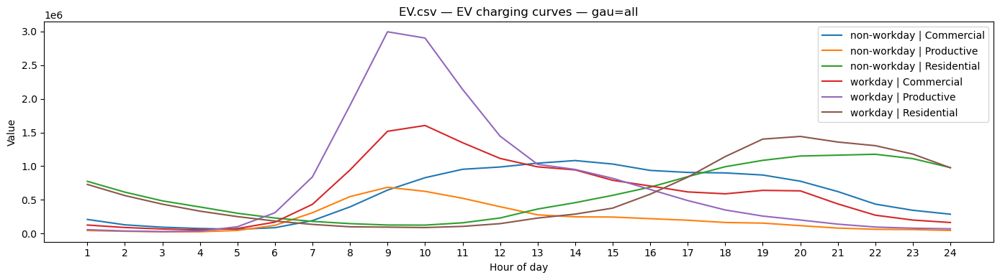


=== Plotting bulk_electricity.csv ===


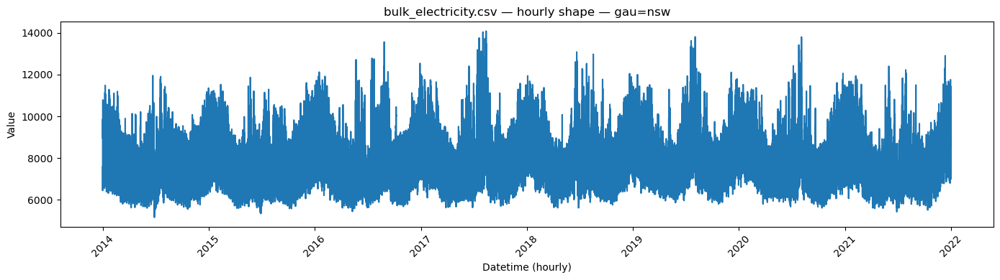

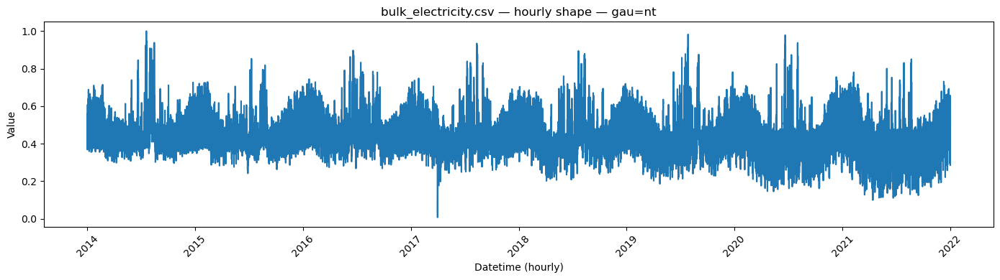

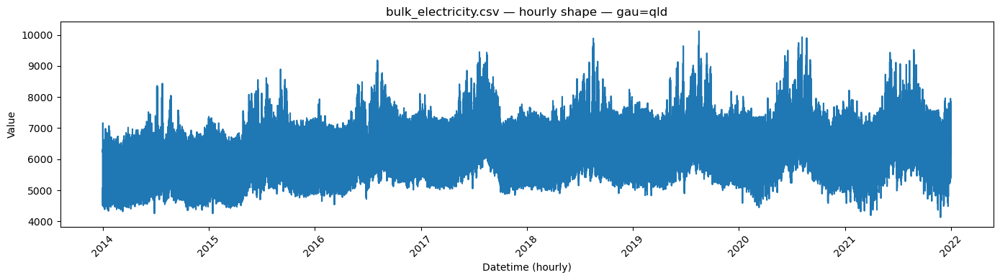

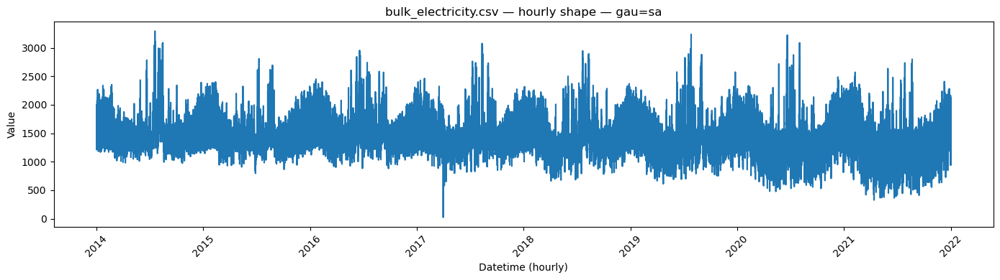

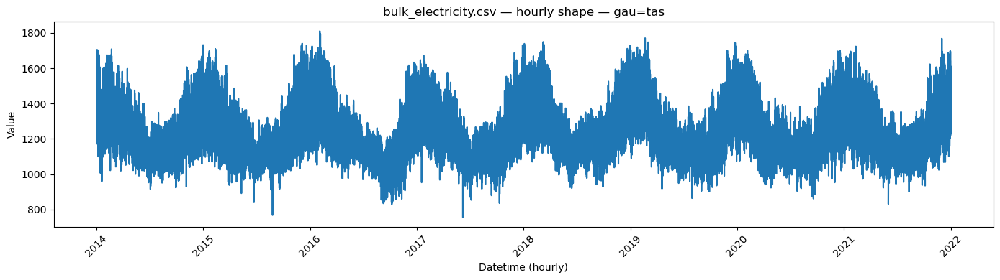

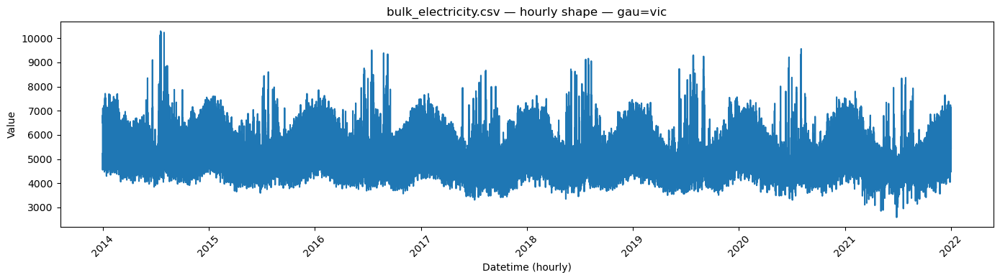

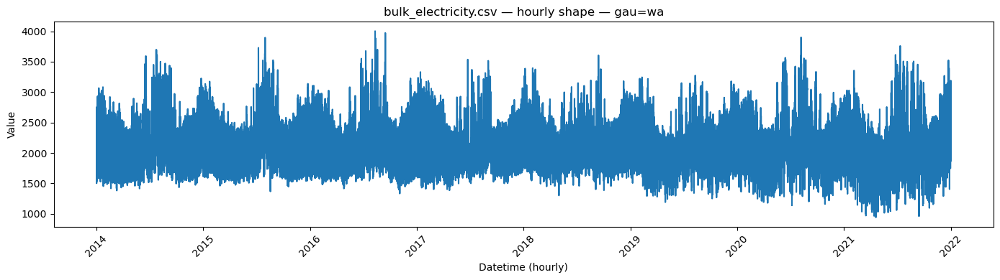


=== Plotting commercial_electricity.csv ===


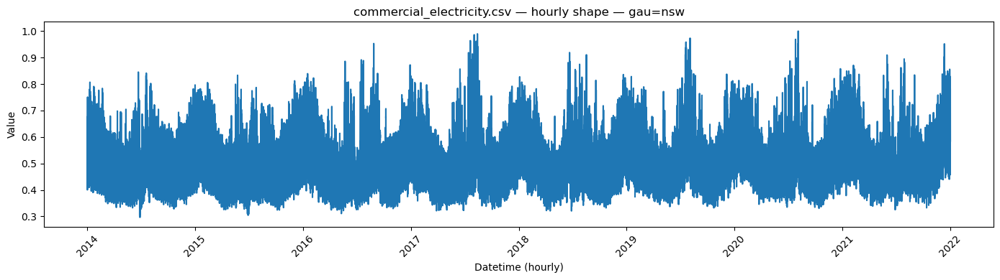

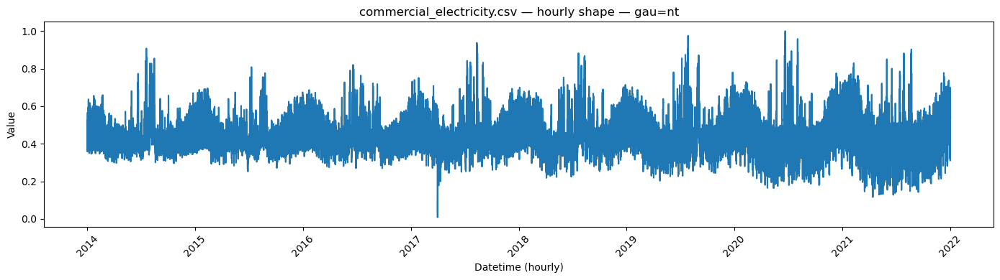

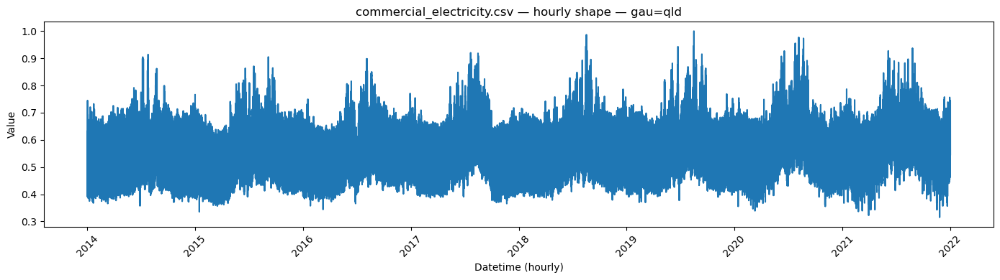

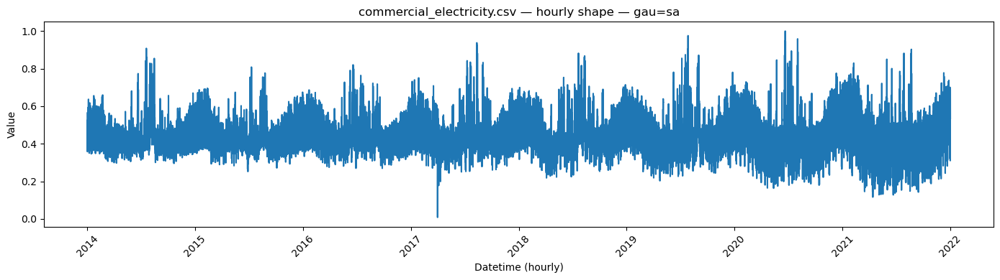

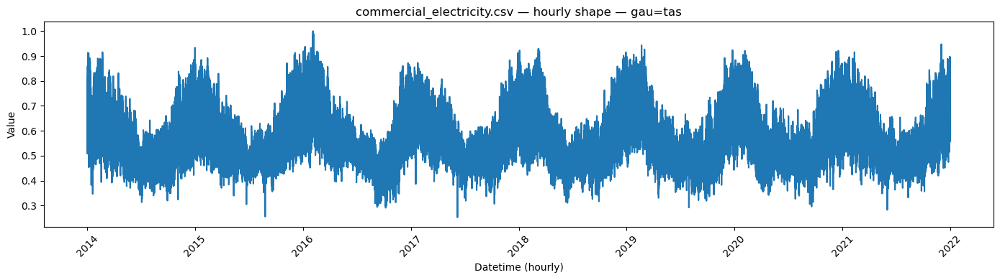

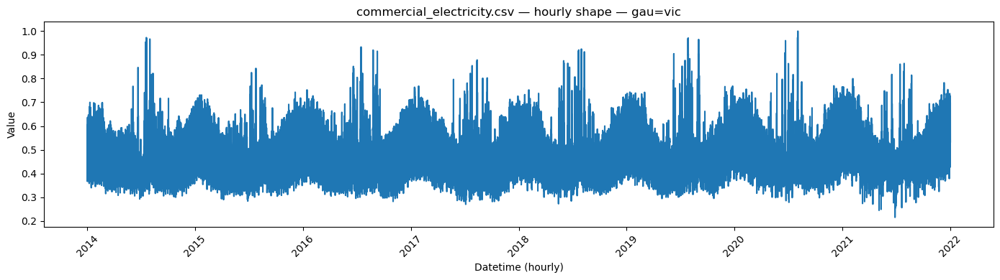

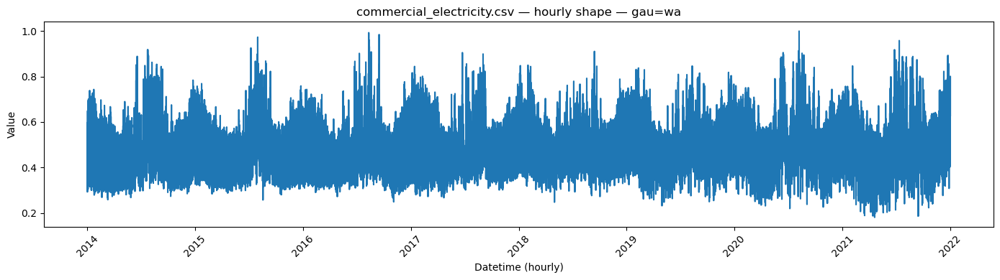


=== Plotting daily_clusters_bulk_electricity.csv ===


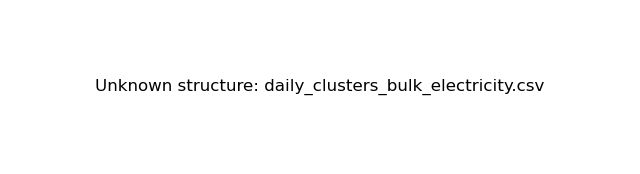


=== Plotting flat_demand_side.csv ===


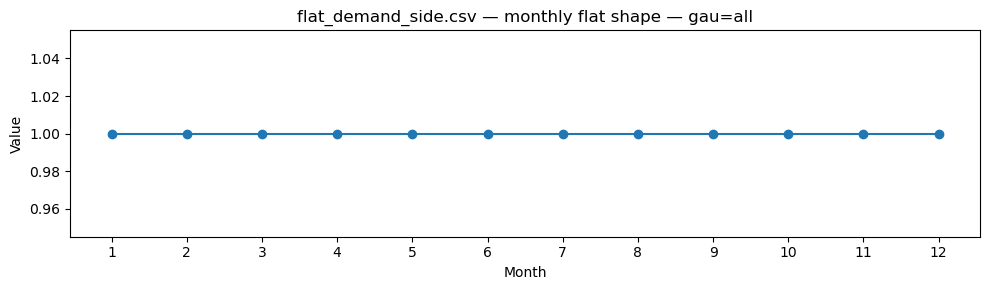


=== Plotting industry_electricity.csv ===


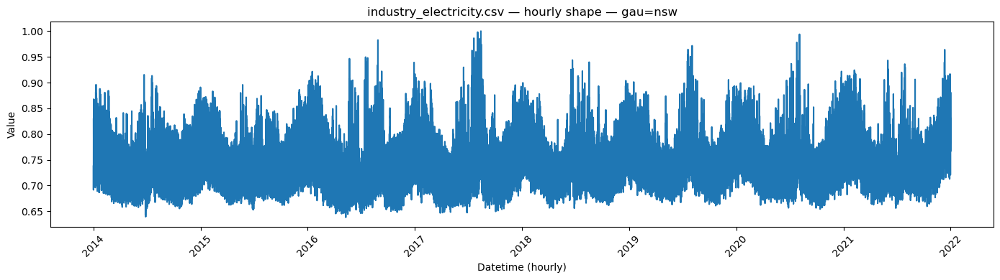

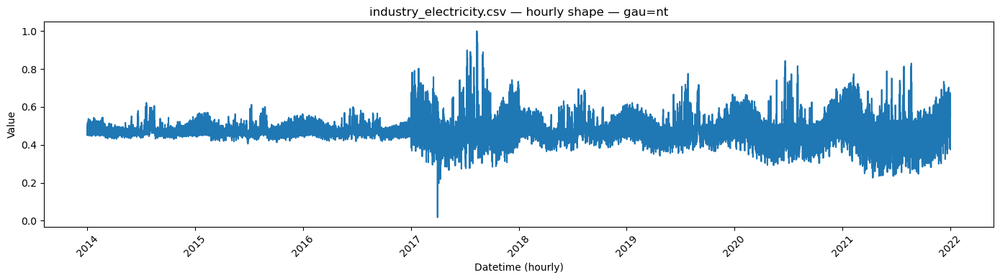

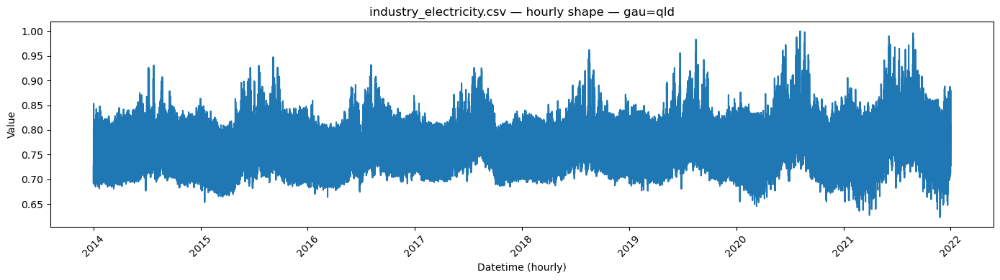

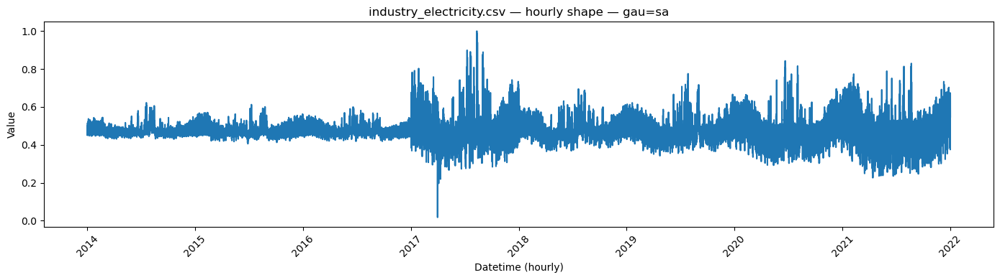

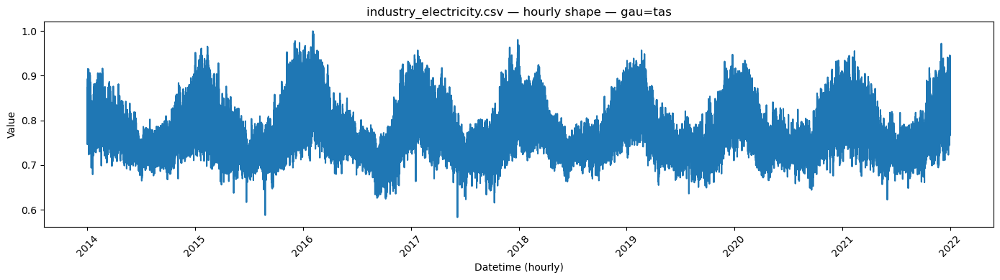

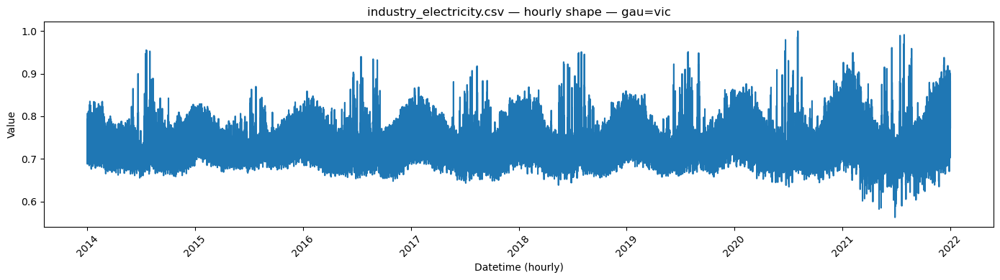

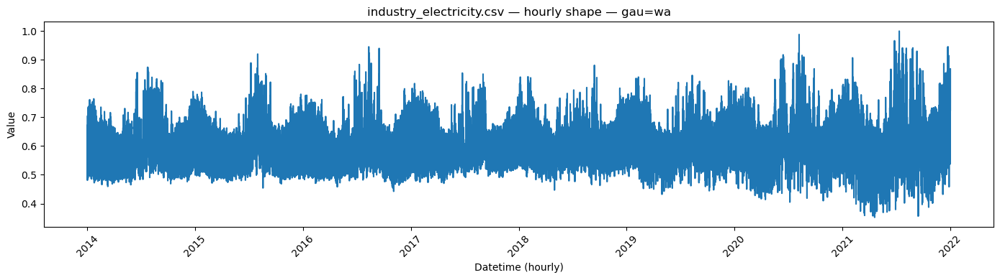


=== Plotting residential_electricity.csv ===


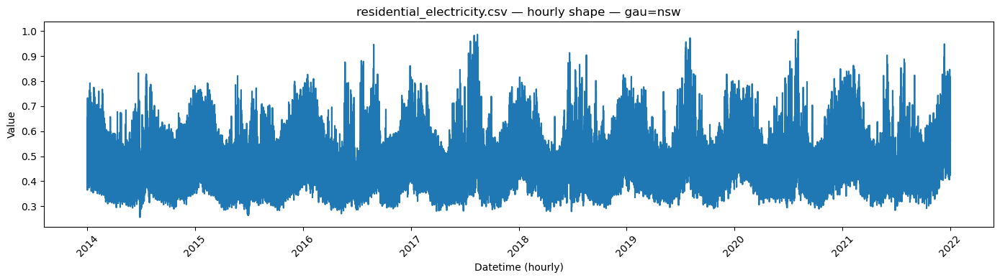

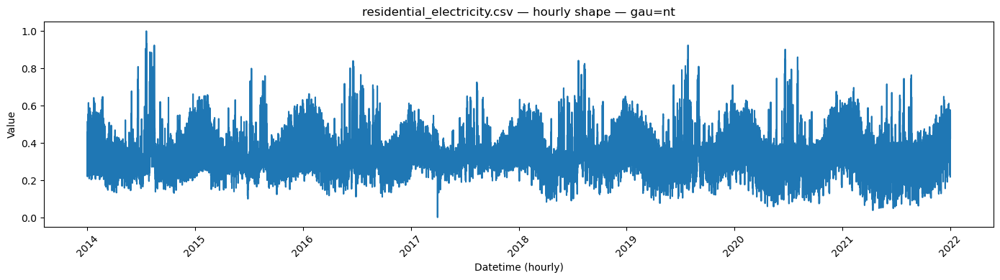

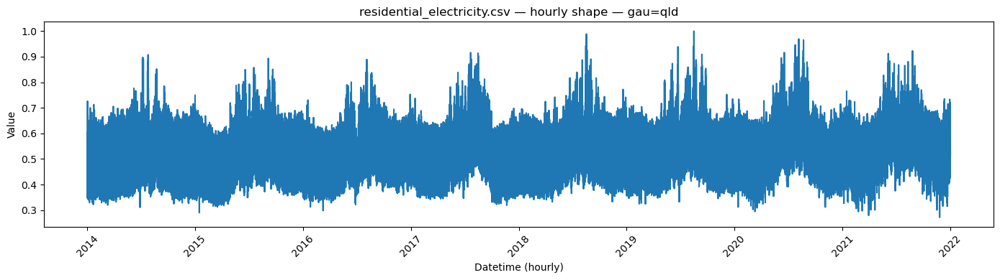

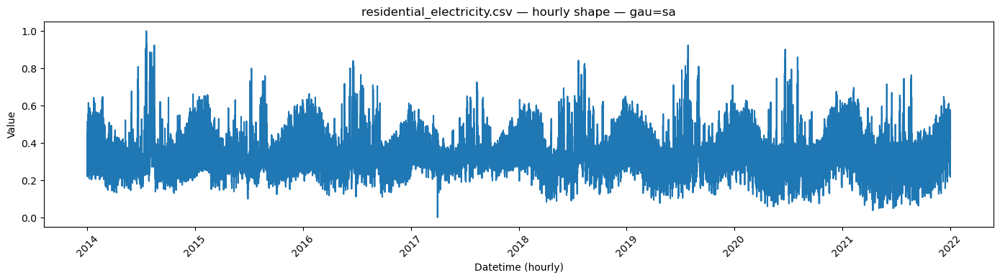

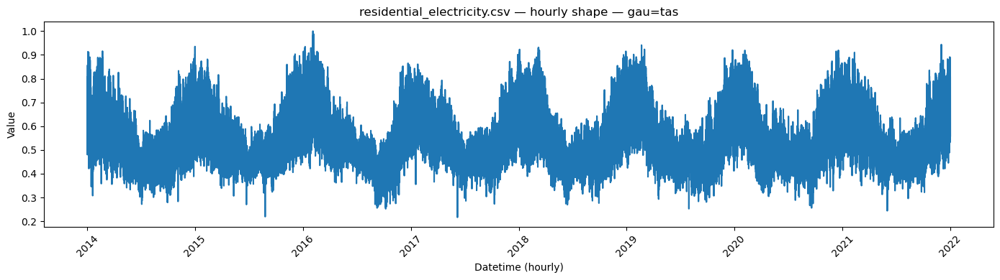

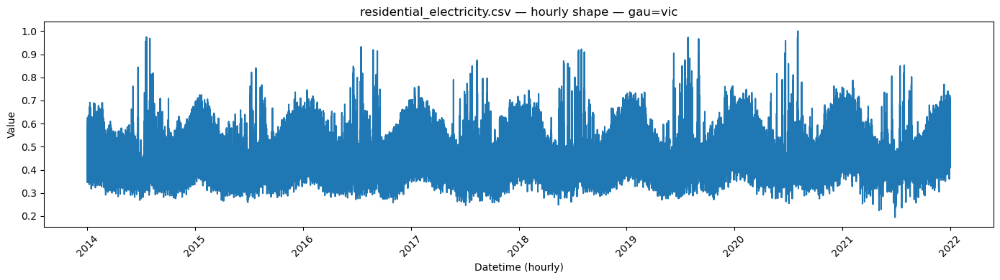

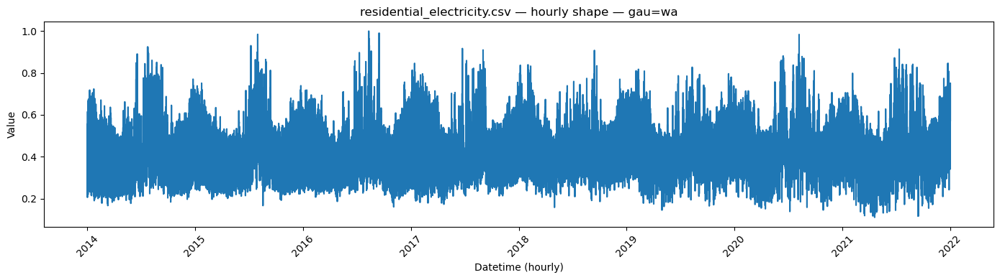


===== HEAD OF EV.csv =====


,gau,day_type,dispatch_feeder,hour,value
0,all,workday,Commercial,1,126788
1,all,workday,Commercial,2,89979
2,all,workday,Commercial,3,67874
3,all,workday,Commercial,4,54391
4,all,workday,Commercial,5,74897



===== HEAD OF bulk_electricity.csv =====


,gau,weather_datetime,value
0,nsw,2014-01-01 00:00:00,7575.185
1,nsw,2014-01-01 01:00:00,7177.945
2,nsw,2014-01-01 02:00:00,6697.050
3,nsw,2014-01-01 03:00:00,6438.425
4,nsw,2014-01-01 04:00:00,6520.810



===== HEAD OF commercial_electricity.csv =====


,gau,weather_datetime,value
0,nsw,2014-01-01 00:00:00,0.491860
1,nsw,2014-01-01 01:00:00,0.459841
2,nsw,2014-01-01 02:00:00,0.421078
3,nsw,2014-01-01 03:00:00,0.400231
4,nsw,2014-01-01 04:00:00,0.406872



===== HEAD OF daily_clusters_bulk_electricity.csv =====


,date,0,1,2,3,4,5,6,7,8,...,15,16,17,18,19,20,21,22,23,cluster
0,2014-01-01,7575.185,7177.945,6697.050,6438.425,6520.810,7070.645,8312.190,9323.875,9857.145,...,9001.355,9292.82,10532.980,10786.755,10339.370,9971.725,9441.260,9130.590,8763.900,1
1,2014-01-02,8362.675,7911.280,7273.040,6830.500,6789.490,7295.345,8546.765,9444.215,9851.515,...,8772.010,9152.36,10442.355,10738.970,10369.555,9997.920,9486.395,9202.705,8830.090,1
2,2014-01-03,8364.155,7929.370,7258.760,6836.070,6788.090,7347.985,8637.095,9579.075,9916.820,...,8628.800,9123.72,10441.705,10746.445,10382.945,10095.840,9601.950,9294.100,8952.910,1
3,2014-01-04,8491.990,8086.475,7436.975,7041.180,7015.670,7573.850,8735.645,9663.700,10024.440,...,8638.500,8985.56,10048.735,10302.690,9944.995,9647.730,9171.075,8957.175,8630.755,1
4,2014-01-05,8202.270,7791.415,7136.600,6780.700,6750.155,7219.390,8332.870,9092.885,9467.495,...,8563.260,8857.28,9839.945,10122.855,9752.495,9471.465,9136.470,9091.315,8875.075,1



===== HEAD OF flat_demand_side.csv =====


,gau,month,value
0,all,1,1
1,all,2,1
2,all,3,1
3,all,4,1
4,all,5,1



===== HEAD OF industry_electricity.csv =====


,gau,weather_datetime,value
0,nsw,2014-01-01 00:00:00,0.737621
1,nsw,2014-01-01 01:00:00,0.721521
2,nsw,2014-01-01 02:00:00,0.702032
3,nsw,2014-01-01 03:00:00,0.691550
4,nsw,2014-01-01 04:00:00,0.694889



===== HEAD OF residential_electricity.csv =====


,gau,weather_datetime,value
0,nsw,2014-01-01 00:00:00,0.461201
1,nsw,2014-01-01 01:00:00,0.427582
2,nsw,2014-01-01 02:00:00,0.386884
3,nsw,2014-01-01 03:00:00,0.364997
4,nsw,2014-01-01 04:00:00,0.371969


In [ ]:
"""
CELL 8 - PLOTS ALL ENERGY PATHWAYS SHAPE INPUT FILES

This cell:
1. Locates all shape CSV files inside ShapeData/.
2. For each file, reads the data and determines its structure:
      - Hourly time-series shapes (weather_datetime)
      - EV charging shapes (hour / day_type / dispatch_feeder)
      - Monthly flat shapes (month)
3. Creates clean, readable plots for each unique 'gau' inside the file.
4. Displays df.head() for each file after plotting.
5. Applies correct axis labels, tick formatting, and legends.
"""
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

shape_dir = r"C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData"

shape_files = sorted([
    os.path.join(shape_dir, f)
    for f in os.listdir(shape_dir)
    if f.endswith(".csv")
])

print("Found shape files:")
for f in shape_files:
    print(" •", os.path.basename(f))

heads = []   # store df.head() for later printing

# -------------------------------------------------------
# PROCESS EACH SHAPE FILE
# -------------------------------------------------------
for file in shape_files:
    df = pd.read_csv(file)
    name = os.path.basename(file)

    # Keep head for later display
    heads.append((name, df.head()))

    # Ensure 'gau' exists
    if "gau" not in df.columns:
        df["gau"] = "all"

    print(f"\n=== Plotting {name} ===")

    # -------------------------------------------
    # CASE 1 — Hourly datetime shapes
    # -------------------------------------------
    if "weather_datetime" in df.columns:
        df["weather_datetime"] = pd.to_datetime(df["weather_datetime"])

        for gau in df["gau"].unique():
            sub = df[df["gau"] == gau]

            plt.figure(figsize=(14,4))
            plt.plot(sub["weather_datetime"], sub["value"])
            plt.title(f"{name} — hourly shape — gau={gau}")
            plt.xlabel("Datetime (hourly)")
            plt.ylabel("Value")

            ax = plt.gca()
            ax.xaxis.set_major_locator(mdates.YearLocator())        # Jan 1 each year
            ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

    # -------------------------------------------
    # CASE 2 — EV charging shapes (hour-of-day)
    # -------------------------------------------
    elif {"hour", "value"}.issubset(df.columns):
        for gau in df["gau"].unique():
            sub = df[df["gau"] == gau]

            plt.figure(figsize=(14,4))
            for (dtype, feeder), grp in sub.groupby(["day_type", "dispatch_feeder"]):
                plt.plot(grp["hour"], grp["value"], label=f"{dtype} | {feeder}")

            plt.title(f"{name} — EV charging curves — gau={gau}")
            plt.xlabel("Hour of day")
            plt.ylabel("Value")
            plt.xticks(range(1, 25))
            plt.legend(loc="upper right")
            plt.tight_layout()
            plt.show()

    # -------------------------------------------
    # CASE 3 — Flat monthly shapes
    # -------------------------------------------
    elif "month" in df.columns:
        for gau in df["gau"].unique():
            sub = df[df["gau"] == gau]

            plt.figure(figsize=(10,3))
            plt.plot(sub["month"], sub["value"], marker="o")
            plt.title(f"{name} — monthly flat shape — gau={gau}")
            plt.xlabel("Month")
            plt.ylabel("Value")
            plt.xticks(range(1, 13))
            plt.tight_layout()
            plt.show()

    # -------------------------------------------
    # UNKNOWN FORMAT
    # -------------------------------------------
    else:
        plt.figure(figsize=(8,2))
        plt.text(0.5, 0.5, f"Unknown structure: {name}",
                 ha="center", va="center", fontsize=12)
        plt.axis("off")
        plt.show()

# -------------------------------------------------------
# PRINT HEADS AFTER ALL PLOTS
# -------------------------------------------------------
for name, hd in heads:
    print(f"\n===== HEAD OF {name} =====")
    display(hd)


Raw columns: ['DEMAND_TECHNOLOGY', 'FINAL_ENERGY', 'NZAU-GEOGRAPHY', 'OTHER_INDEX_1', 'SCENARIO', 'SECTOR', 'SUBSECTOR', 'UNIT', 'YEAR', 'VALUE']

Processed annual electricity dataset:
  NZAU-GEOGRAPHY  YEAR  VALUE  GWh
0         ex-nsw  2018    0.0  0.0
1         ex-nsw  2019    0.0  0.0
2         ex-nsw  2020    0.0  0.0
3         ex-nsw  2021    0.0  0.0
4         ex-nsw  2022    0.0  0.0
5         ex-nsw  2023    0.0  0.0
6         ex-nsw  2024    0.0  0.0
7         ex-nsw  2025    0.0  0.0
8         ex-nsw  2026    0.0  0.0
9         ex-nsw  2027    0.0  0.0


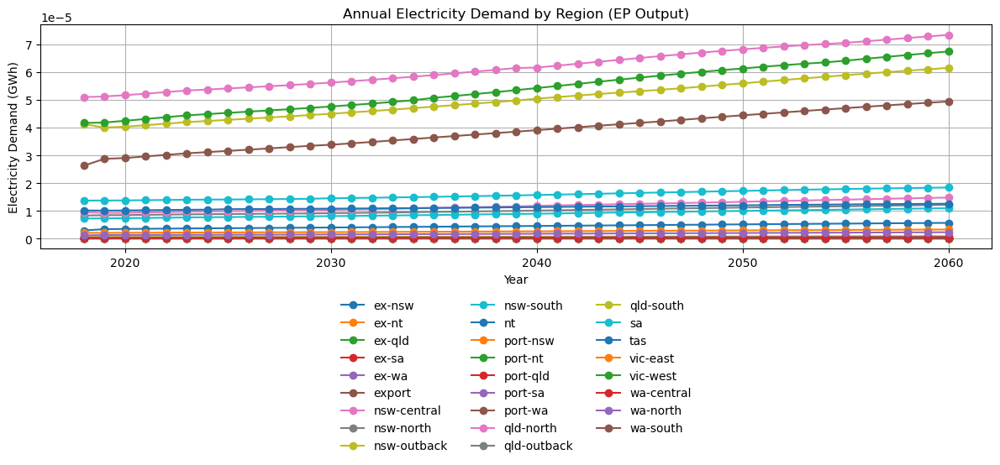

In [ ]:

# CELL 9 - ANNUAL ELECTRICITY DEMAND TRAJECTORIES FOR EACH REGION

# -------------------------------------------------------------------------
# This cell loads the EnergyPATHWAYS final-energy output file (d_energy.csv.gz),
# filters it to electricity consumption only, aggregates electricity demand
# by region and year, converts the resulting energy values from Joules to GWh,
# prints a preview of the processed dataset, and plots annual electricity
# demand trajectories for each region.
#
# The file d_energy.csv.gz contains final energy demand by:
#   - FINAL_ENERGY (fuel type: electricity, gas, hydrogen, etc.)
#   - NZAU-GEOGRAPHY (region/state)
#   - SECTOR / SUBSECTOR / DEMAND_TECHNOLOGY
#   - YEAR and VALUE (energy use)
#
# This cell performs the first step in model calibration by producing
# annual regional electricity totals that can later be compared to
# AEMO state-level demand projections (e.g., Step Change or Central).
# -------------------------------------------------------------------------



import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# Load EP energy output
# -----------------------------
df = pd.read_csv(
    r"C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario\reference\demand_outputs\d_energy.csv.gz"
)

print("Raw columns:", df.columns.tolist())

# -----------------------------
# Filter to electricity only
# -----------------------------
df_el = df[df["FINAL_ENERGY"] == "electricity"].copy()

# -----------------------------
# Aggregate to regional annual totals
# -----------------------------
annual = (
    df_el.groupby(["NZAU-GEOGRAPHY", "YEAR"])["VALUE"]
         .sum()
         .reset_index()
)

# Convert Joules → GWh
annual["GWh"] = annual["VALUE"] / 3.6e12

# -----------------------------
# Print preview
# -----------------------------
print("\nProcessed annual electricity dataset:")
print(annual.head(10))

# -----------------------------
# Plot annual regional electricity demand
# -----------------------------
plt.figure(figsize=(12,6))

for region, group in annual.groupby("NZAU-GEOGRAPHY"):
    plt.plot(group["YEAR"], group["GWh"], marker="o", label=region)

plt.title("Annual Electricity Demand by Region (EP Output)")
plt.xlabel("Year")
plt.ylabel("Electricity Demand (GWh)")
plt.grid(True)

# --- Place legend below the plot ---
plt.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, -0.18),   # move legend below axis
    ncol=3,                        # adjust number of columns as needed
    frameon=False
)

plt.tight_layout()
plt.show()



In [ ]:
"""
#CELL 10 - This script generates probabilistic hourly demand "POE shapes" from deterministic
EnergyPATHWAYS input shape data using a stochastic weather-normalisation procedure.

For each electricity shape file and each GAU:
  • A reference hourly demand shape is treated as a baseline year.
  • Thousands of synthetic weather-years are generated by:
      1) randomly shifting the reference year by ±3 days (block bootstrapping),
      2) applying multiplicative, hour-level weather variability, and
      3) adding small additive residual noise to represent unexplained demand variation.
  • These synthetic years preserve realistic intra-day and seasonal correlations
    while introducing variability consistent with AEMO-style weather simulation.

From the ensemble of simulated hourly demand traces, pointwise percentiles are
computed at each hour of the year:
  • P10: the 90th percentile (high-demand extreme at each hour),
  • P50: the median,
  • P90: the 10th percentile (low-demand extreme at each hour).

The resulting POE shapes represent conditional, sub-annual probability-of-exceedance
profiles that characterise how demand magnitude and intraday structure vary under
different weather realisations.

Important:
  • These POE shapes are NOT AEMO-style POE maximum demand forecasts.
  • Percentiles are computed independently at each hour, so the P10/P50/P90 curves
    do not correspond to any single realised year.
  • True AEMO POE maxima require ranking annual (or seasonal) maximum demand values
    across simulations and cannot be recovered from these pointwise POE shapes alone.

The outputs are intended for:
  • visualisation of weather-driven uncertainty in demand shapes,
  • scenario-based stress testing,
  • post-processing or probabilistic extensions layered on top of EP,
  • and methodological alignment with AEMO’s half-hourly simulation framework,
    without modifying EP’s deterministic core.
"""

import os
import numpy as np
import pandas as pd

shape_dir = r"C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData"

# OUTPUT folder (inside ShapeData/pickles or create new folder)
out_dir = os.path.join(shape_dir, "poe_shapes")
os.makedirs(out_dir, exist_ok=True)

print("Saving POE shapes to:", out_dir)

# ============================================================
# PARAMETERS (tune as desired)
# ============================================================
N_SIM = 3000                 # number of synthetic years (AEMO uses ~2975)
DAY_SHIFT_MAX = 3            # ±3 days shift (as per AEMO)
MUL_SIGMA = 0.04             # 4% multiplicative weather variation
RESIDUAL_SIGMA = 0.01        # 1% additive noise

# ============================================================
# FUNCTION: generate P10/P50/P90 shapes for one dataframe
# ============================================================
def generate_poe_from_reference(df, gau):

    ref = df[df["gau"] == gau].copy()
    ref = ref.sort_values("weather_datetime")

    ref_index = ref["weather_datetime"]
    ref_values = ref["value"].values
    H = len(ref_values)

    sims = np.zeros((N_SIM, H))

    for i in range(N_SIM):

        # ---- 1. Day shift (±3 days) ----
        shift_days = np.random.randint(-DAY_SHIFT_MAX, DAY_SHIFT_MAX + 1)
        shift = shift_days * 24  # hourly
        shifted = np.roll(ref_values, shift)

        # ---- 2. Multiplicative weather variability ----
        mul = np.random.normal(1, MUL_SIGMA, H)
        weathered = shifted * mul

        # ---- 3. Additive residual ε_h ----
        eps = np.random.normal(0, RESIDUAL_SIGMA, H)
        syn = weathered + eps

        sims[i] = syn

    # ---- Percentiles over the ensemble ----
    P10 = np.percentile(sims, 90, axis=0)   # High-demand extreme
    P50 = np.percentile(sims, 50, axis=0)   # Median
    P90 = np.percentile(sims, 10, axis=0)   # Low-demand extreme

    out = pd.DataFrame({
        "weather_datetime": ref_index.values,
        "gau": gau,
        "P10": P10,
        "P50": P50,
        "P90": P90
    })

    return out


# ============================================================
# PROCESS ALL SHAPE FILES
# ============================================================
shape_files = [
    f for f in os.listdir(shape_dir)
    if f.endswith(".csv") and "electricity" in f.lower()
]

print("\nProcessing EP datetime shape files:")
for f in shape_files:
    print(" •", f)

for file in shape_files:

    path = os.path.join(shape_dir, file)
    print(f"\n=== Generating POE shapes for {file} ===")

    df = pd.read_csv(path)

    if "weather_datetime" not in df.columns:
        print("  Skipping — not a datetime shape file.")
        continue

    df["weather_datetime"] = pd.to_datetime(df["weather_datetime"])

    all_outputs = []

    for gau in df["gau"].unique():
        print(f"  → GAU = {gau}")
        poe_df = generate_poe_from_reference(df, gau)
        all_outputs.append(poe_df)

    final = pd.concat(all_outputs, ignore_index=True)

    out_path = os.path.join(out_dir, file.replace(".csv", "_POE.csv"))
    final.to_csv(out_path, index=False)

    print("  Saved:", out_path)

print("\nDONE.")


Saving POE shapes to: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_shapes

Processing EP datetime shape files:
 • bulk_electricity.csv
 • commercial_electricity.csv
 • daily_clusters_bulk_electricity.csv
 • industry_electricity.csv
 • residential_electricity.csv

=== Generating POE shapes for bulk_electricity.csv ===
  → GAU = nsw
  → GAU = nt
  → GAU = qld
  → GAU = sa
  → GAU = tas
  → GAU = vic
  → GAU = wa
  Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_shapes\bulk_electricity_POE.csv

=== Generating POE shapes for commercial_electricity.csv ===
  → GAU = nsw
  → GAU = nt
  → GAU = qld
  → GAU = sa
  → GAU = tas
  → GAU = vic
  → GAU = wa
  Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_shapes\commercial_electricity_POE.csv

=== Generating POE shapes for daily_clusters_bulk_electricity.csv ===
  Skipping — not a datetime shape file.

=== Generating POE shapes for industry_electricity.csv ===
  → GAU = nsw
  → GAU = nt
  → GAU = qld
  → GAU = sa
  → G

Found original shape files:
 • bulk_electricity.csv
 • commercial_electricity.csv
 • daily_clusters_bulk_electricity.csv
 • industry_electricity.csv
 • residential_electricity.csv

Found POE shape files:
 • bulk_electricity_POE.csv
 • commercial_electricity_POE.csv
 • industry_electricity_POE.csv
 • residential_electricity_POE.csv

=== Plotting POE comparison for bulk_electricity ===


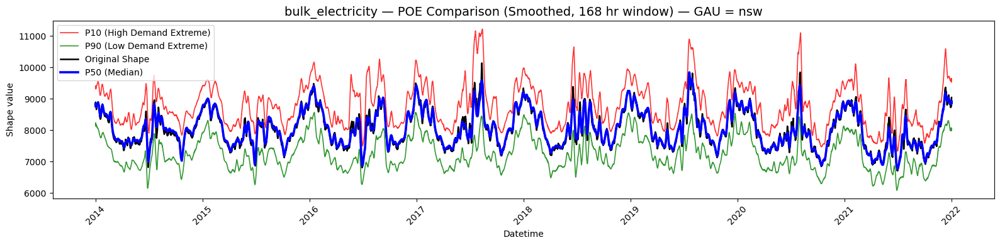

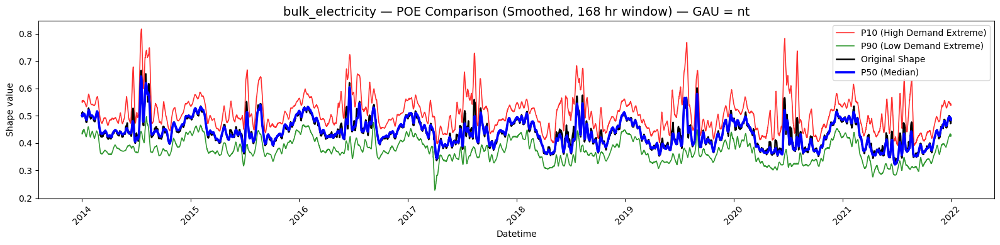

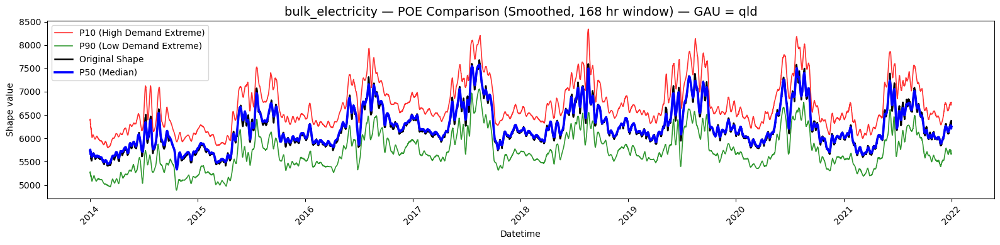

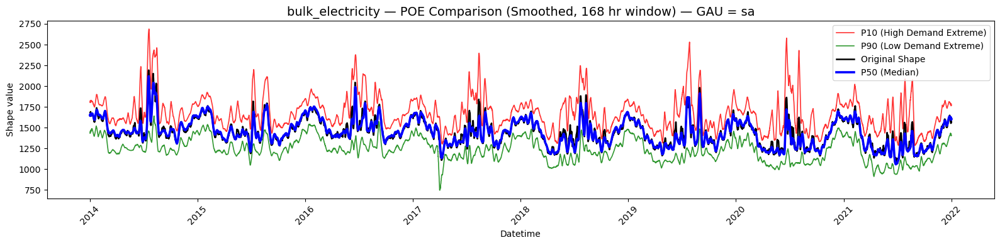

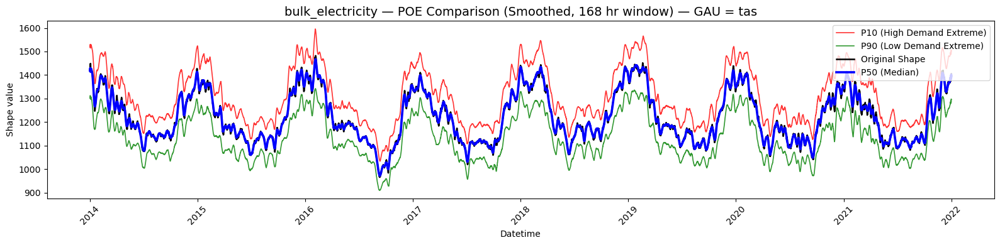

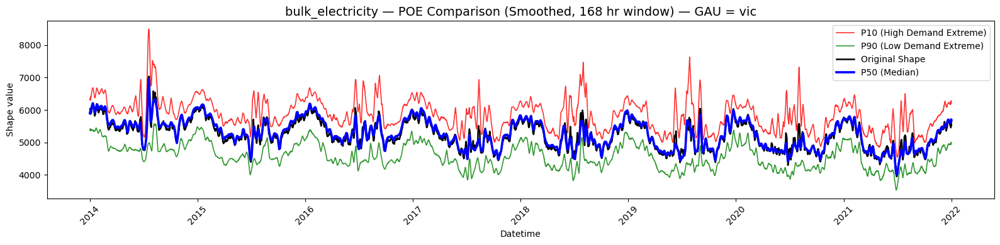

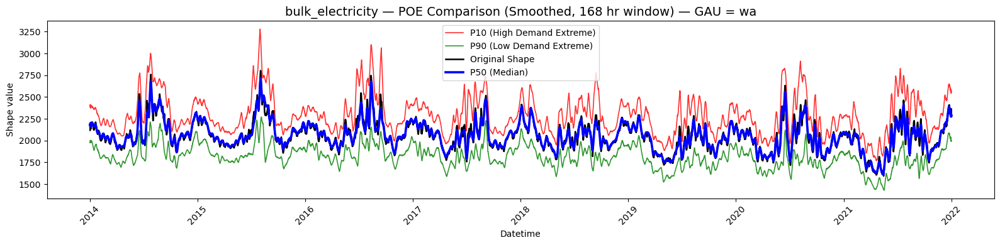


=== Plotting POE comparison for commercial_electricity ===


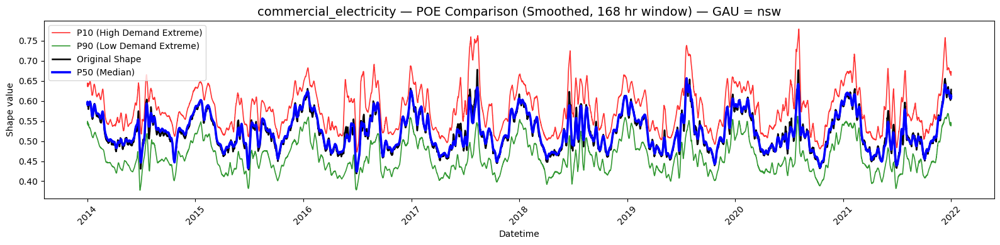

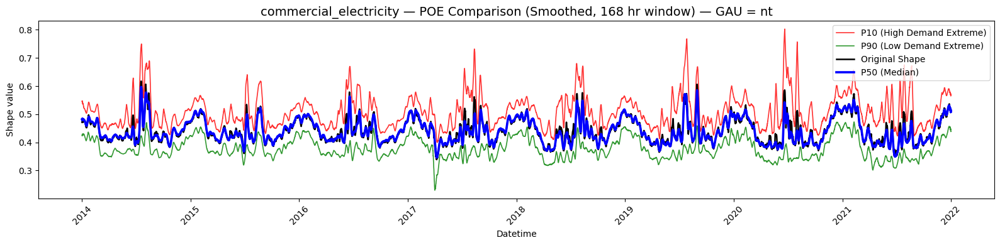

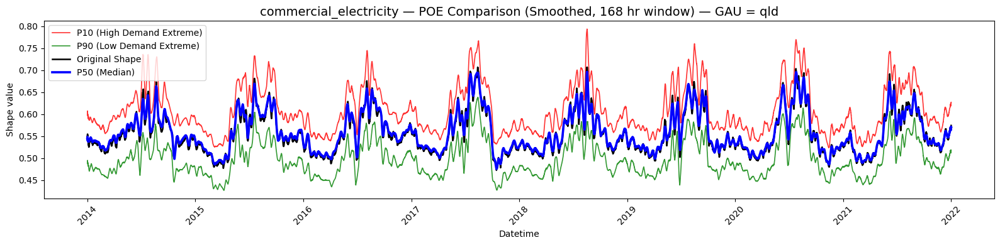

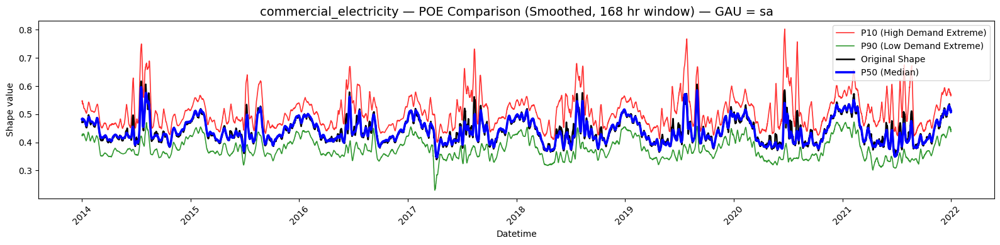

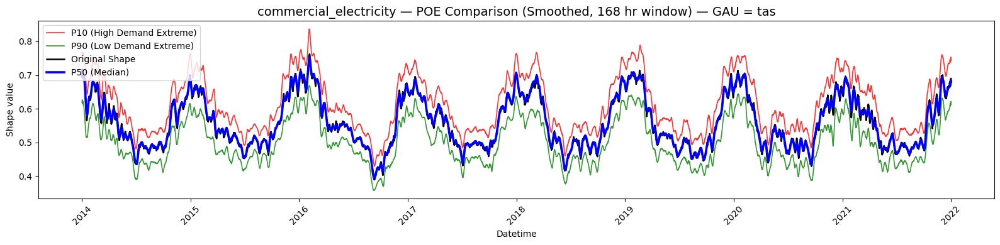

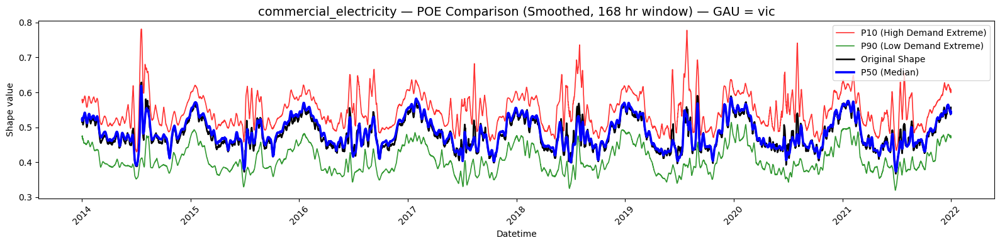

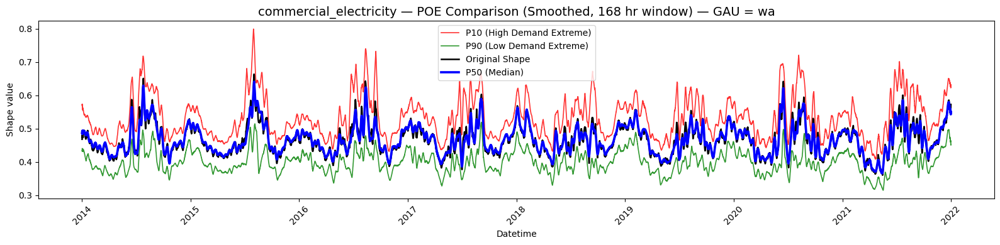


No POE file found for daily_clusters_bulk_electricity, skipping.

=== Plotting POE comparison for industry_electricity ===


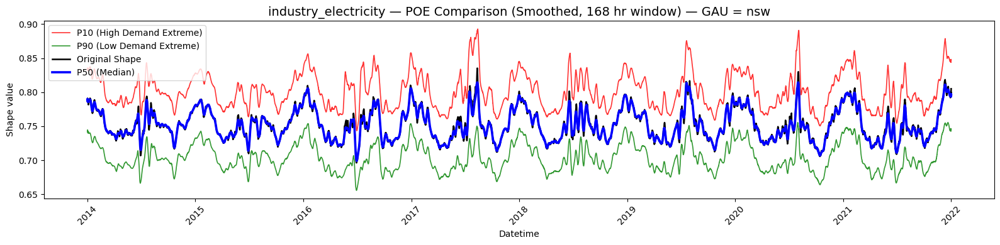

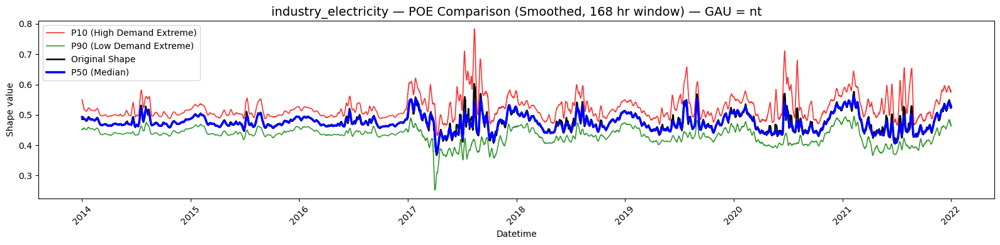

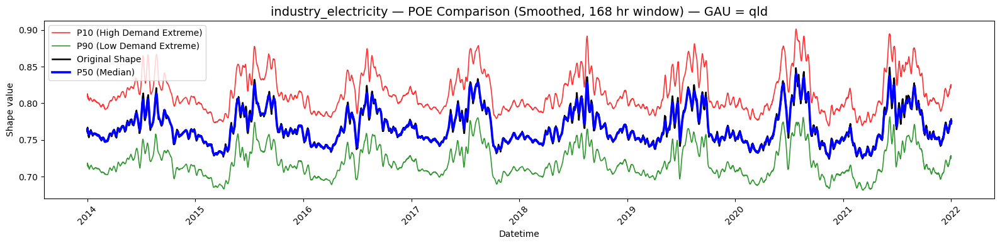

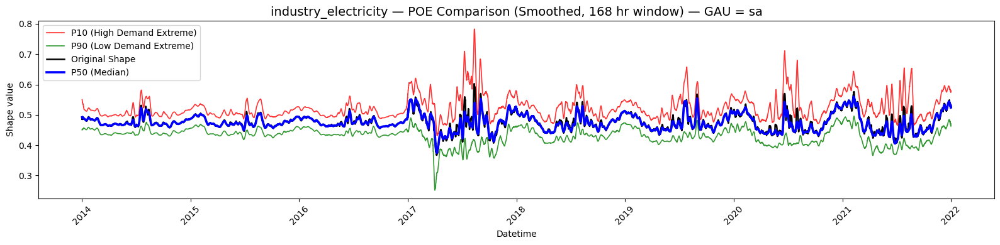

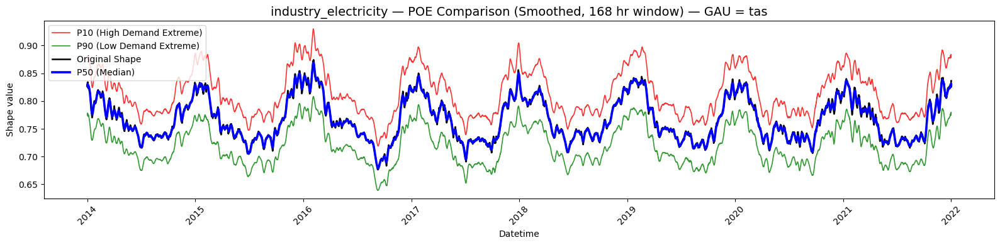

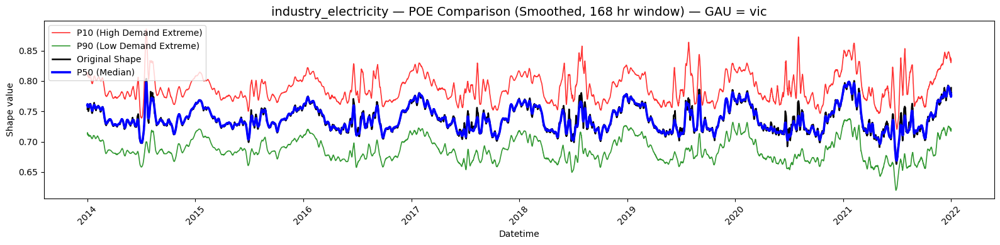

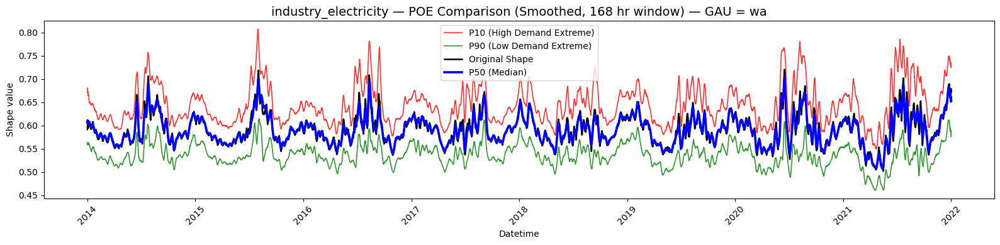


=== Plotting POE comparison for residential_electricity ===


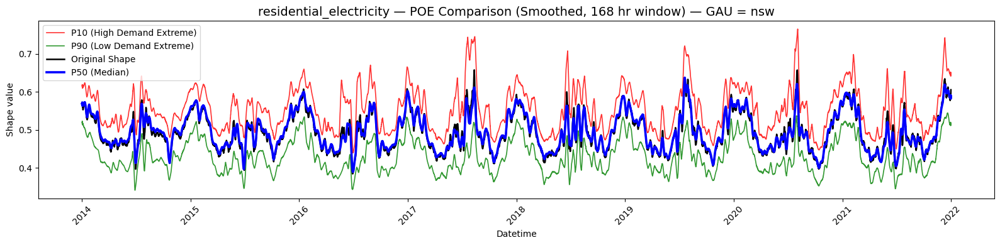

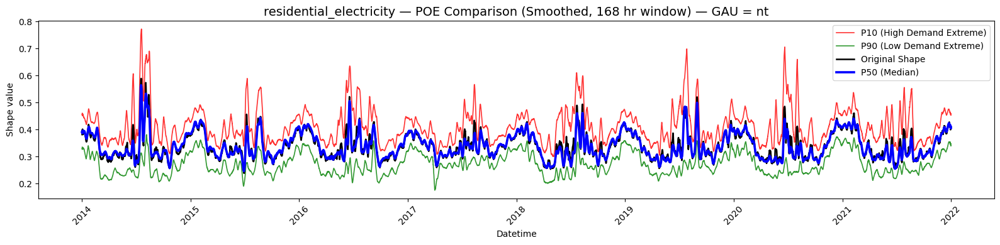

c:\Users\mrmat\miniforge3\envs\ep\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


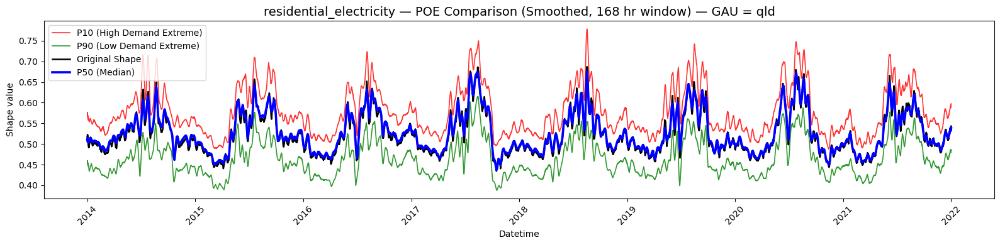

C:\Users\mrmat\AppData\Local\Temp\ipykernel_60252\2821808805.py:133: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


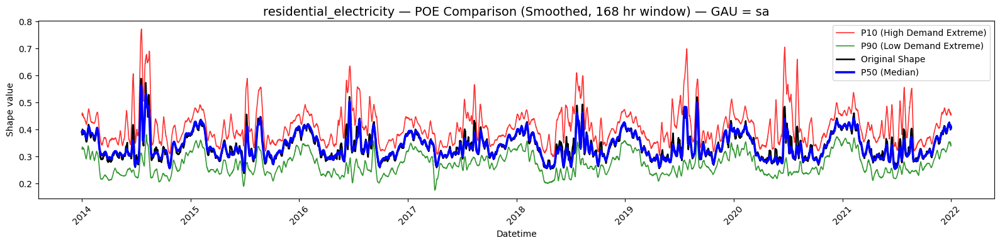

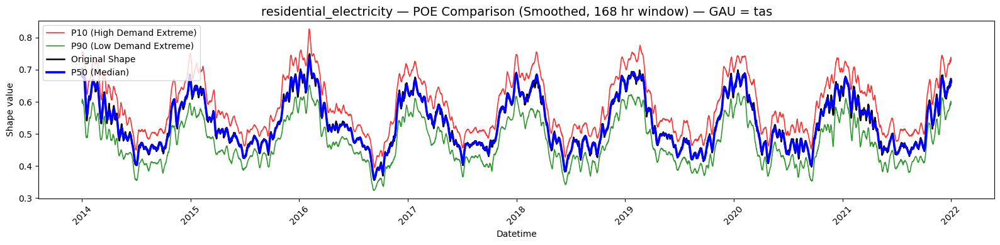

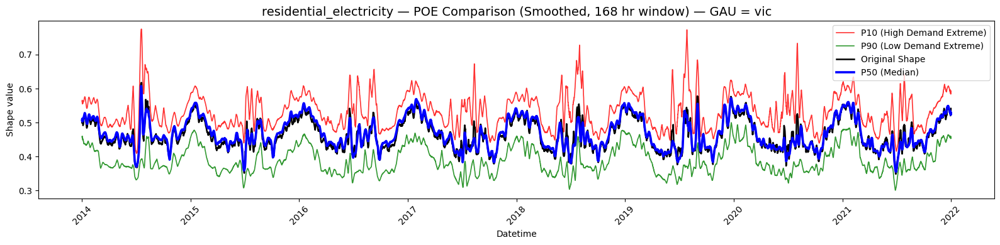

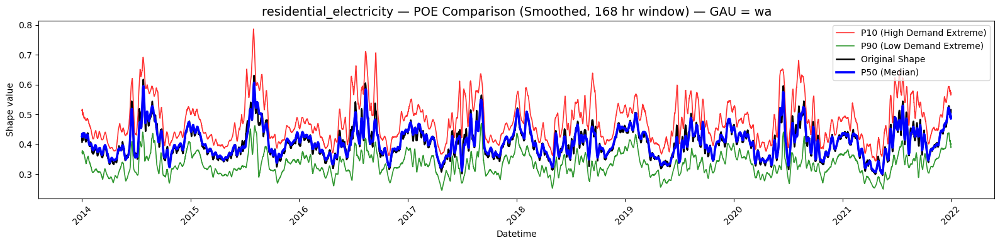

In [ ]:

"""
#CELL 11 - Comparison of Original and POE Electricity Load Shapes

This cell compares original hourly electricity shape files with their
corresponding Probability of Exceedance (POE) versions (P10, P50, P90)
from the EnergyPATHWAYS ShapeData directory.

Workflow summary:
1. Locate original electricity shape CSV files and matching POE files.
2. Load each original–POE file pair and parse datetime fields.
3. Ensure a GAU identifier exists to allow separate analysis by region.
4. For each GAU:
   - Apply a centred rolling mean to smooth time series without
     introducing phase lag.
   - Smooth the original shape and POE percentiles (P10, P50, P90)
     using a configurable window.
5. Plot layered time-series comparisons:
   - P10 and P90 as an outer demand envelope.
   - Original shape for reference.
   - P50 as the dominant median trajectory.
6. Generate separate plots per file and GAU to visually assess how POE
   envelopes relate to the original demand shape over time.

The plots provide a clear visual check of POE construction, smoothing
effects, and consistency between original and probabilistic shapes.
"""


import os
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------------------------------------
# SETTINGS
# -------------------------------------------------------
shape_dir = r"C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData"
poe_dir   = os.path.join(shape_dir, "poe_shapes")

SMOOTH_WINDOW = 168   # hours; increase to 48 for stronger smoothing

# -------------------------------------------------------
# HELPER: centered smoothing (NO lag)
# -------------------------------------------------------
def smooth_centered(series, window=24):
    """
    Centered rolling mean to smooth time series without phase shift.
    """
    return (
        series
        .rolling(window=window, center=True, min_periods=1)
        .mean()
    )

# -------------------------------------------------------
# FIND INPUT FILES
# -------------------------------------------------------
orig_files = sorted([
    os.path.join(shape_dir, f)
    for f in os.listdir(shape_dir)
    if f.endswith(".csv") and "electricity" in f.lower()
])

poe_files = sorted([
    os.path.join(poe_dir, f)
    for f in os.listdir(poe_dir)
    if f.endswith("_POE.csv")
])

print("Found original shape files:")
for f in orig_files:
    print(" •", os.path.basename(f))

print("\nFound POE shape files:")
for f in poe_files:
    print(" •", os.path.basename(f))

# -------------------------------------------------------
# PLOT POE COMPARISONS
# -------------------------------------------------------
for orig_path in orig_files:

    name = os.path.basename(orig_path).replace(".csv", "")
    poe_name = name + "_POE.csv"
    poe_path = os.path.join(poe_dir, poe_name)

    if not os.path.exists(poe_path):
        print(f"\nNo POE file found for {name}, skipping.")
        continue

    print(f"\n=== Plotting POE comparison for {name} ===")

    df_orig = pd.read_csv(orig_path)
    df_poe  = pd.read_csv(poe_path)

    if "weather_datetime" not in df_orig.columns:
        print("  Not a datetime shape — skipping.")
        continue

    df_orig["weather_datetime"] = pd.to_datetime(df_orig["weather_datetime"])
    df_poe["weather_datetime"]  = pd.to_datetime(df_poe["weather_datetime"])

    # Ensure GAU exists
    if "gau" not in df_orig.columns:
        df_orig["gau"] = "all"
    if "gau" not in df_poe.columns:
        df_poe["gau"] = "all"

    # ---------------------------------------------------
    # PLOT EACH GAU SEPARATELY
    # ---------------------------------------------------
    for gau in df_orig["gau"].unique():

        sub_orig = (
            df_orig[df_orig["gau"] == gau]
            .sort_values("weather_datetime")
        )

        sub_poe = (
            df_poe[df_poe["gau"] == gau]
            .sort_values("weather_datetime")
        )

        # Smooth (NO lag)
        orig_s = smooth_centered(sub_orig["value"], SMOOTH_WINDOW)
        p10_s  = smooth_centered(sub_poe["P10"],  SMOOTH_WINDOW)
        p50_s  = smooth_centered(sub_poe["P50"],  SMOOTH_WINDOW)
        p90_s  = smooth_centered(sub_poe["P90"],  SMOOTH_WINDOW)

        # ------------------------------------------------
        # PLOT (layered for visibility)
        # ------------------------------------------------
        plt.figure(figsize=(16,4))

        # Extremes first (background envelope)
        plt.plot(sub_poe["weather_datetime"], p10_s,
                 label="P10 (High Demand Extreme)",
                 color="red", linewidth=1.2, alpha=0.8, zorder=1)

        plt.plot(sub_poe["weather_datetime"], p90_s,
                 label="P90 (Low Demand Extreme)",
                 color="green", linewidth=1.2, alpha=0.8, zorder=1)

        # Original shape
        plt.plot(sub_orig["weather_datetime"], orig_s,
                 label="Original Shape",
                 color="black", linewidth=1.8, zorder=2)

        # P50 LAST (dominant, clearly visible)
        plt.plot(sub_poe["weather_datetime"], p50_s,
                 label="P50 (Median)",
                 color="blue", linewidth=2.6, zorder=3)

        plt.title(
            f"{name} — POE Comparison (Smoothed, {SMOOTH_WINDOW} hr window) — GAU = {gau}",
            fontsize=14
        )
        plt.xlabel("Datetime")
        plt.ylabel("Shape value")
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()


Writing AEMO-style maxima POE outputs to: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima

Processing:
 • bulk_electricity.csv
 • commercial_electricity.csv
 • daily_clusters_bulk_electricity.csv
 • industry_electricity.csv
 • residential_electricity.csv

=== bulk_electricity.csv | GAU=nsw | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\bulk_electricity__nsw__annual_maxima.csv
P10 max (1-in-10 high): 15248.077833
P50 max (median):       14845.618036
P90 max (mild):         14530.760999


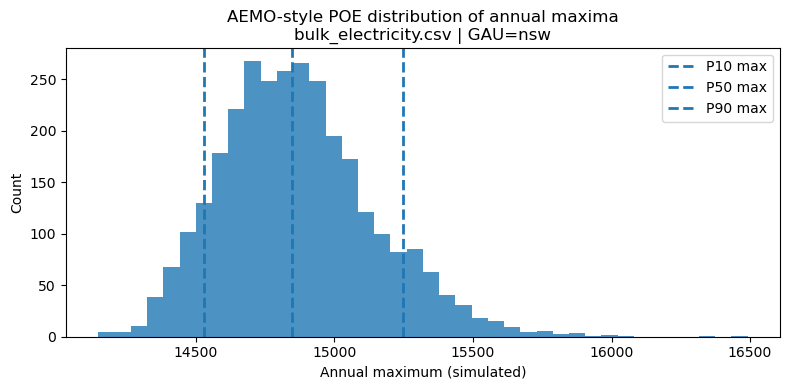


=== bulk_electricity.csv | GAU=nt | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\bulk_electricity__nt__annual_maxima.csv
P10 max (1-in-10 high): 1.071716
P50 max (median):       1.039319
P90 max (mild):         1.014438


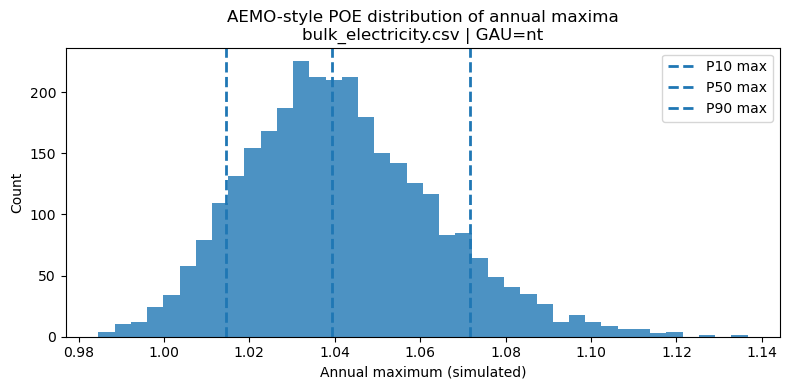


=== bulk_electricity.csv | GAU=qld | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\bulk_electricity__qld__annual_maxima.csv
P10 max (1-in-10 high): 10890.882399
P50 max (median):       10598.904976
P90 max (mild):         10377.527891


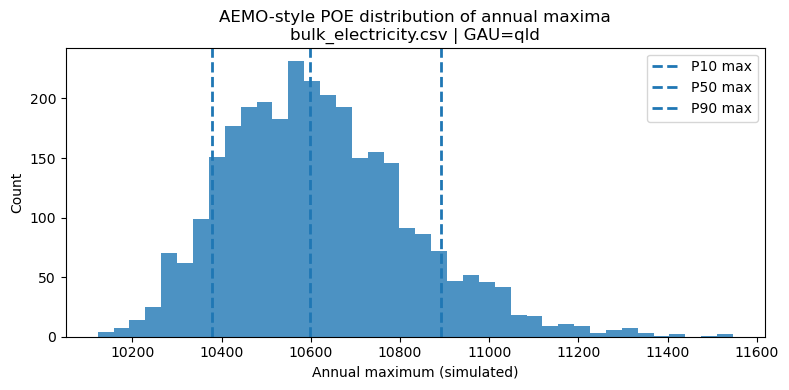


=== bulk_electricity.csv | GAU=sa | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\bulk_electricity__sa__annual_maxima.csv
P10 max (1-in-10 high): 3517.866064
P50 max (median):       3415.461651
P90 max (mild):         3335.403299


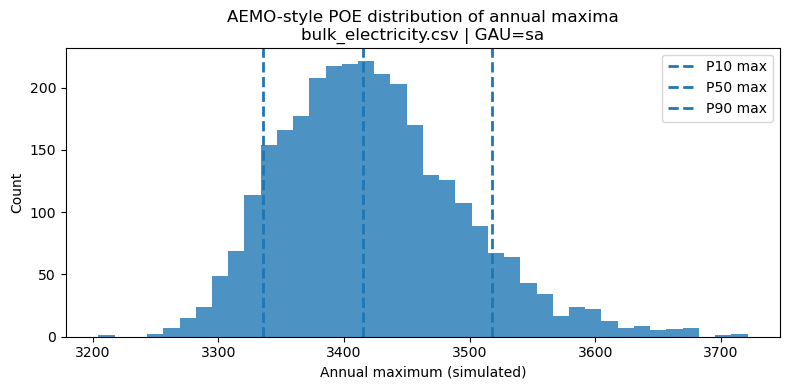


=== bulk_electricity.csv | GAU=tas | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\bulk_electricity__tas__annual_maxima.csv
P10 max (1-in-10 high): 1955.831461
P50 max (median):       1909.769398
P90 max (mild):         1876.416061


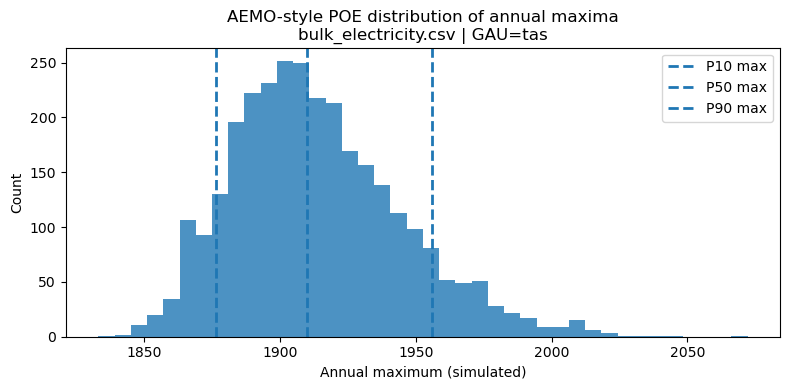


=== bulk_electricity.csv | GAU=vic | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\bulk_electricity__vic__annual_maxima.csv
P10 max (1-in-10 high): 11198.926336
P50 max (median):       10901.423312
P90 max (mild):         10662.356282


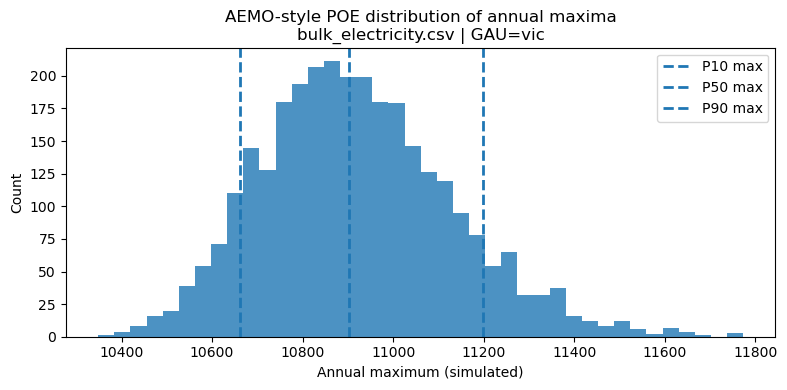


=== bulk_electricity.csv | GAU=wa | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\bulk_electricity__wa__annual_maxima.csv
P10 max (1-in-10 high): 4329.551907
P50 max (median):       4205.186474
P90 max (mild):         4111.799314


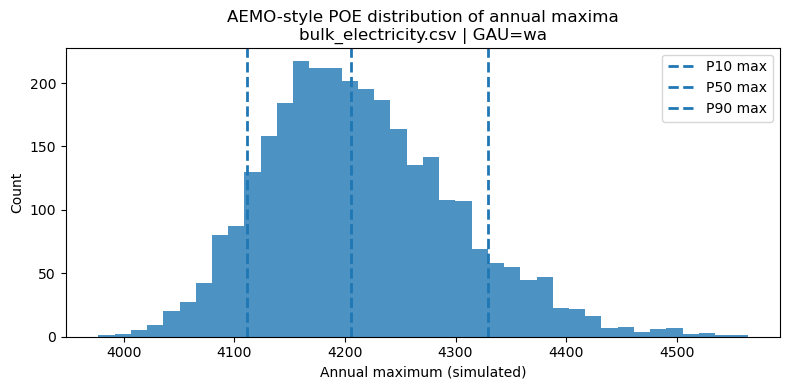


=== commercial_electricity.csv | GAU=nsw | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\commercial_electricity__nsw__annual_maxima.csv
P10 max (1-in-10 high): 1.080599
P50 max (median):       1.050664
P90 max (mild):         1.028481


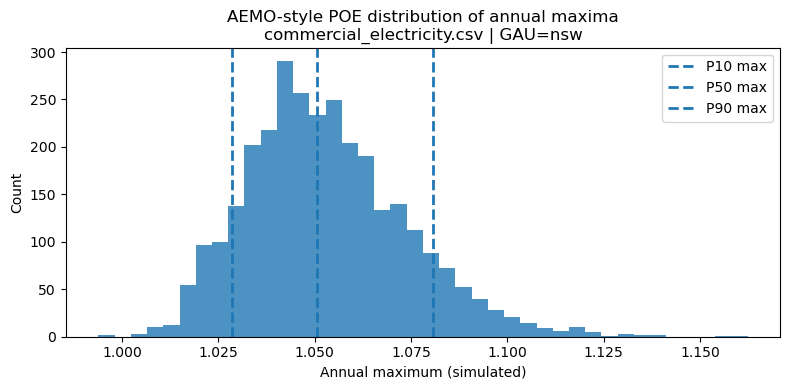


=== commercial_electricity.csv | GAU=nt | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\commercial_electricity__nt__annual_maxima.csv
P10 max (1-in-10 high): 1.068318
P50 max (median):       1.033861
P90 max (mild):         1.007412


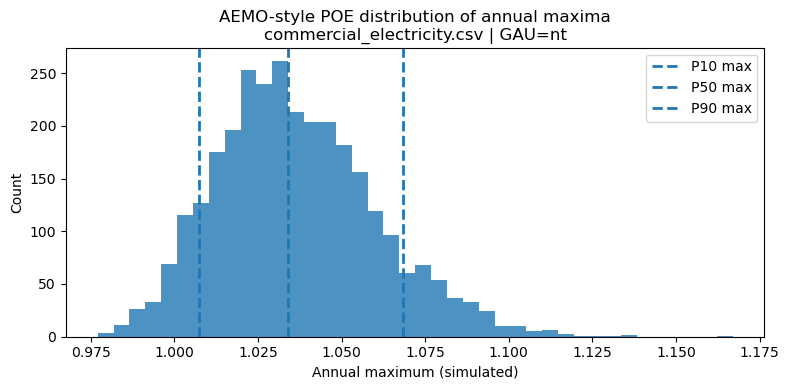


=== commercial_electricity.csv | GAU=qld | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\commercial_electricity__qld__annual_maxima.csv
P10 max (1-in-10 high): 1.079053
P50 max (median):       1.047319
P90 max (mild):         1.024253


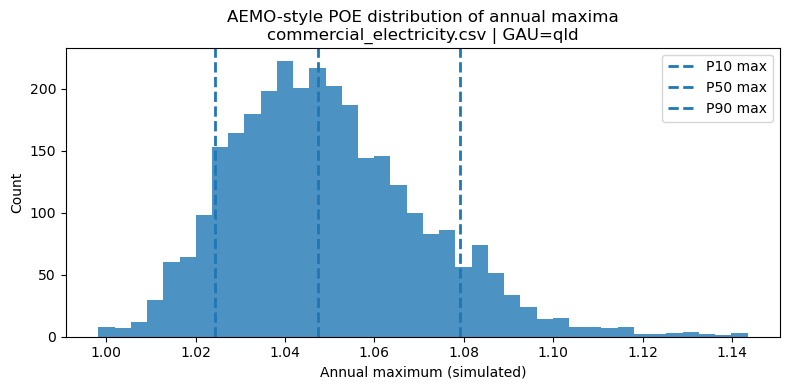


=== commercial_electricity.csv | GAU=sa | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\commercial_electricity__sa__annual_maxima.csv
P10 max (1-in-10 high): 1.070122
P50 max (median):       1.033872
P90 max (mild):         1.007499


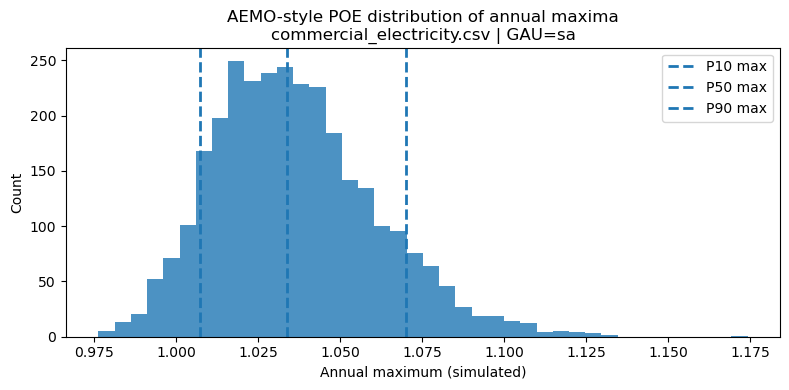


=== commercial_electricity.csv | GAU=tas | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\commercial_electricity__tas__annual_maxima.csv
P10 max (1-in-10 high): 1.071428
P50 max (median):       1.038971
P90 max (mild):         1.015031


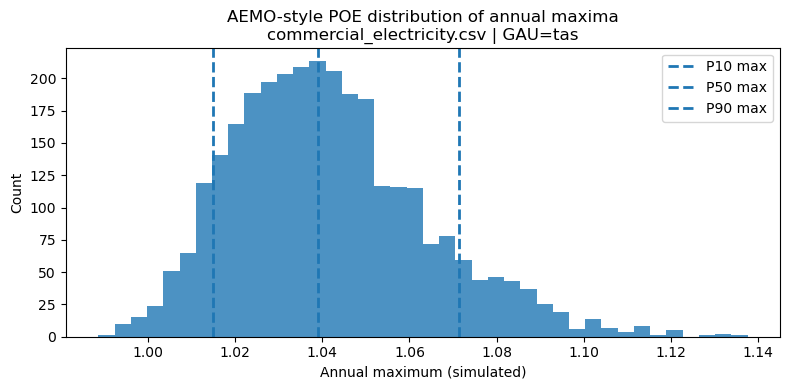


=== commercial_electricity.csv | GAU=vic | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\commercial_electricity__vic__annual_maxima.csv
P10 max (1-in-10 high): 1.077576
P50 max (median):       1.049084
P90 max (mild):         1.026879


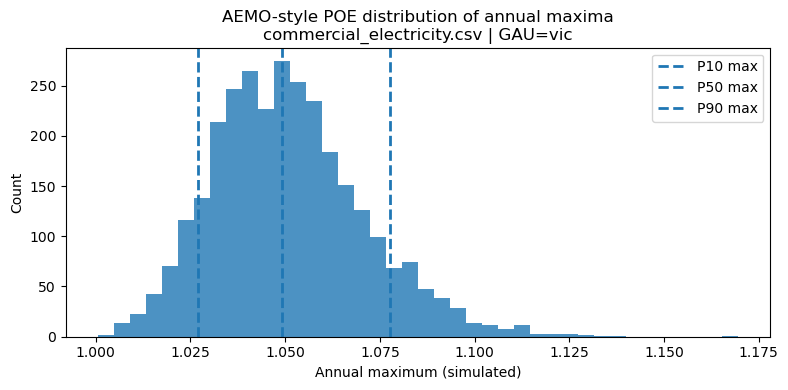


=== commercial_electricity.csv | GAU=wa | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\commercial_electricity__wa__annual_maxima.csv
P10 max (1-in-10 high): 1.083558
P50 max (median):       1.051965
P90 max (mild):         1.028982


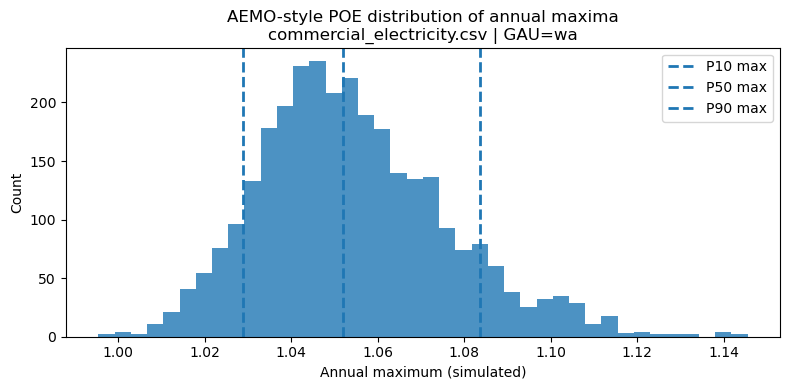


Skipping daily_clusters_bulk_electricity.csv (not a datetime shape file).

=== industry_electricity.csv | GAU=nsw | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\industry_electricity__nsw__annual_maxima.csv
P10 max (1-in-10 high): 1.096220
P50 max (median):       1.069145
P90 max (mild):         1.049620


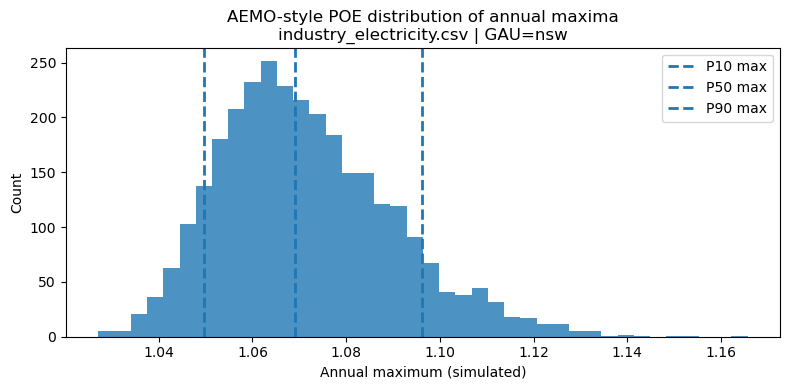


=== industry_electricity.csv | GAU=nt | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\industry_electricity__nt__annual_maxima.csv
P10 max (1-in-10 high): 1.072095
P50 max (median):       1.036305
P90 max (mild):         1.007778


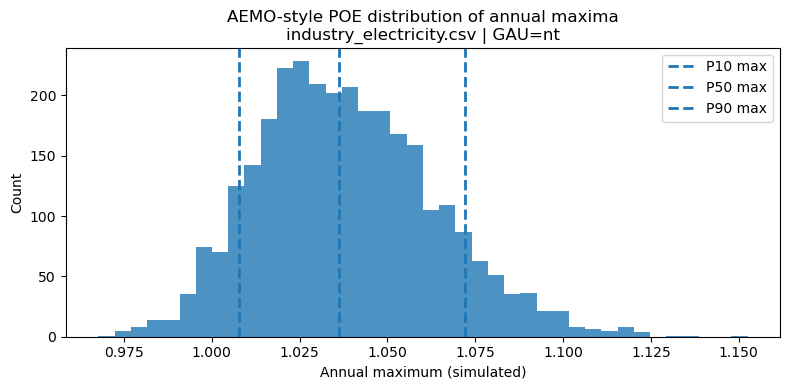


=== industry_electricity.csv | GAU=qld | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\industry_electricity__qld__annual_maxima.csv
P10 max (1-in-10 high): 1.097597
P50 max (median):       1.071569
P90 max (mild):         1.052667


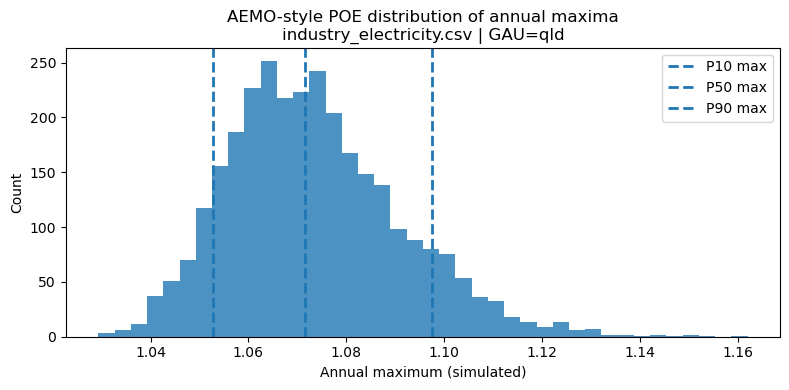


=== industry_electricity.csv | GAU=sa | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\industry_electricity__sa__annual_maxima.csv
P10 max (1-in-10 high): 1.072041
P50 max (median):       1.036026
P90 max (mild):         1.007939


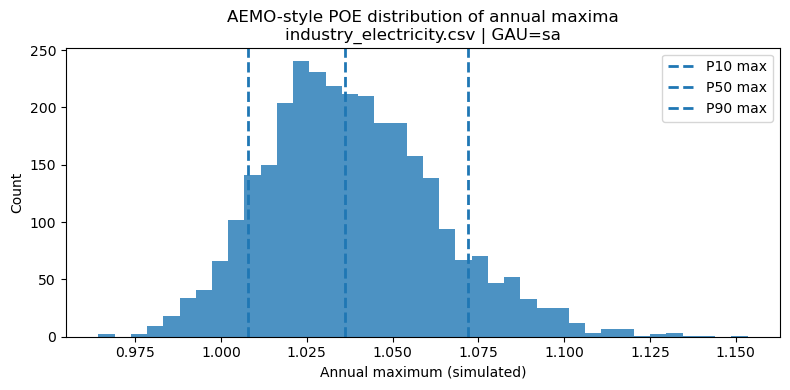


=== industry_electricity.csv | GAU=tas | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\industry_electricity__tas__annual_maxima.csv
P10 max (1-in-10 high): 1.092145
P50 max (median):       1.067505
P90 max (mild):         1.051431


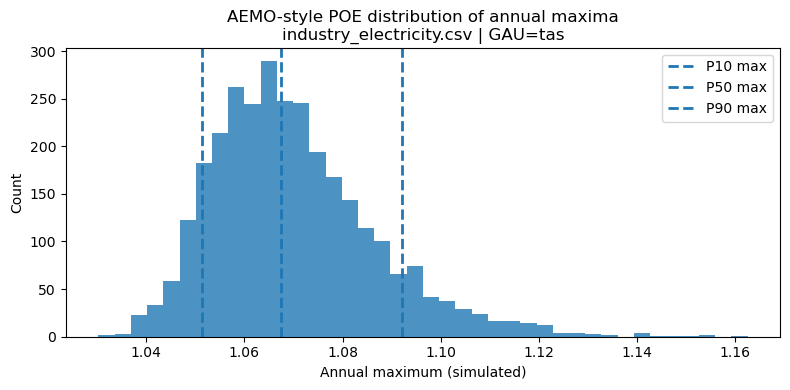


=== industry_electricity.csv | GAU=vic | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\industry_electricity__vic__annual_maxima.csv
P10 max (1-in-10 high): 1.088436
P50 max (median):       1.059959
P90 max (mild):         1.040222


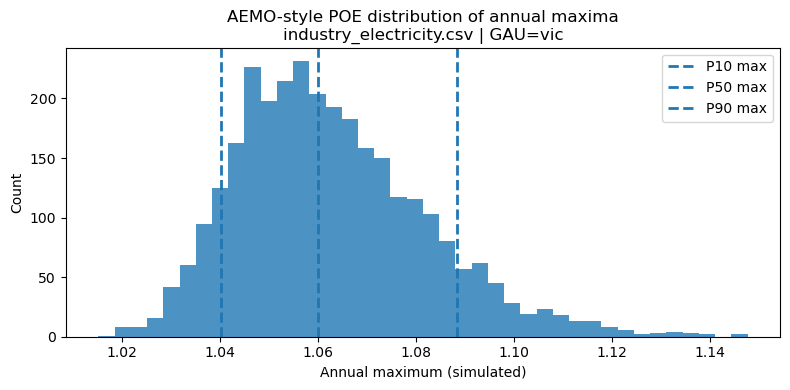


=== industry_electricity.csv | GAU=wa | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\industry_electricity__wa__annual_maxima.csv
P10 max (1-in-10 high): 1.077483
P50 max (median):       1.044280
P90 max (mild):         1.019704


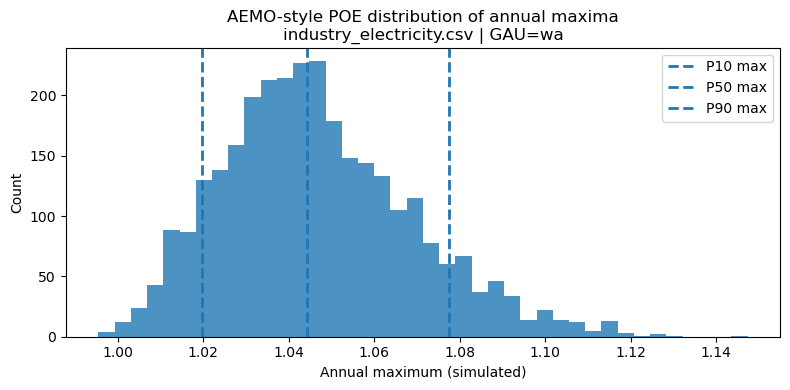


=== residential_electricity.csv | GAU=nsw | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\residential_electricity__nsw__annual_maxima.csv
P10 max (1-in-10 high): 1.078303
P50 max (median):       1.048255
P90 max (mild):         1.025168


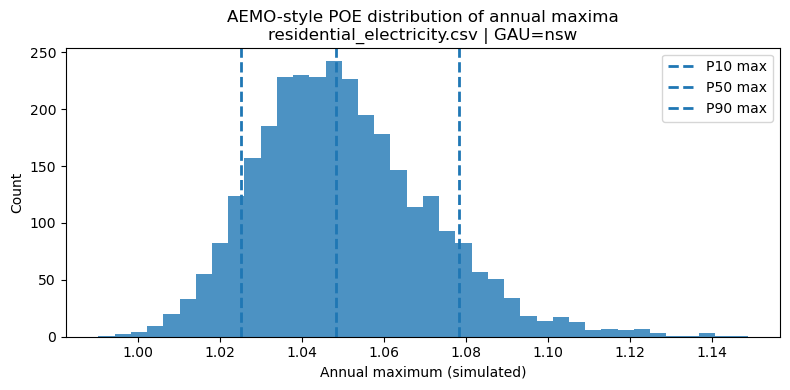


=== residential_electricity.csv | GAU=nt | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\residential_electricity__nt__annual_maxima.csv
P10 max (1-in-10 high): 1.061634
P50 max (median):       1.021275
P90 max (mild):         0.991614


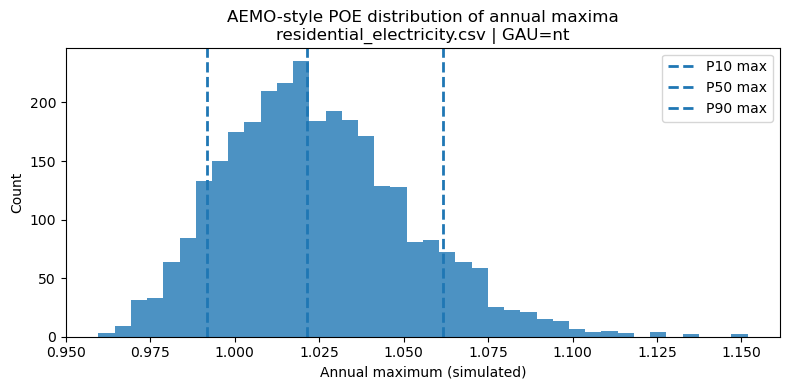


=== residential_electricity.csv | GAU=qld | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\residential_electricity__qld__annual_maxima.csv
P10 max (1-in-10 high): 1.076496
P50 max (median):       1.044657
P90 max (mild):         1.020982


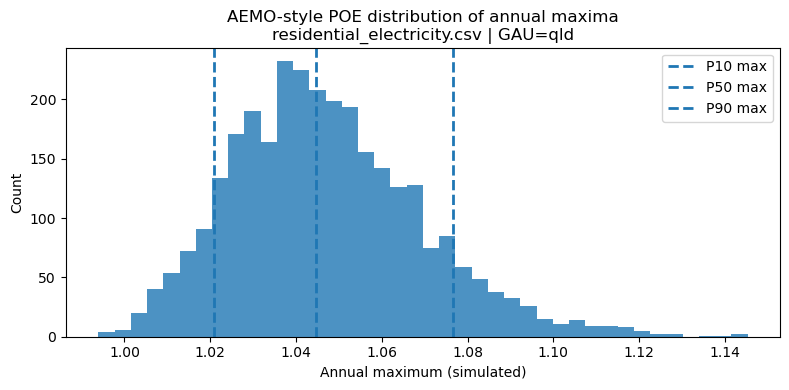


=== residential_electricity.csv | GAU=sa | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\residential_electricity__sa__annual_maxima.csv
P10 max (1-in-10 high): 1.059524
P50 max (median):       1.020237
P90 max (mild):         0.990863


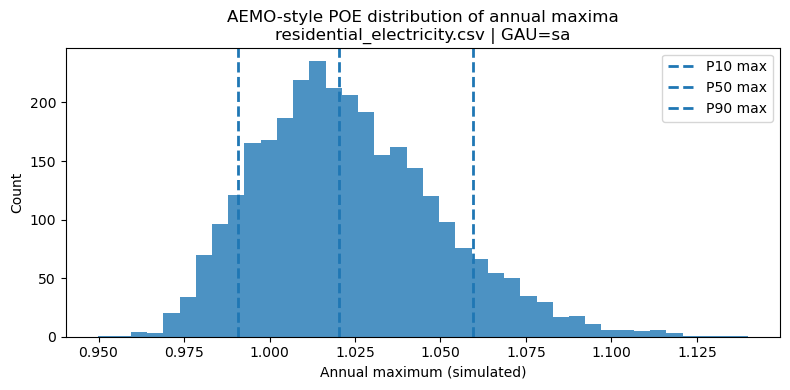


=== residential_electricity.csv | GAU=tas | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\residential_electricity__tas__annual_maxima.csv
P10 max (1-in-10 high): 1.069418
P50 max (median):       1.037177
P90 max (mild):         1.013164


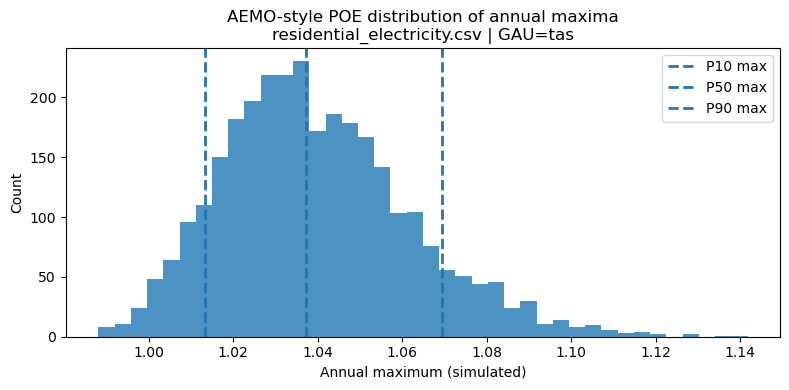


=== residential_electricity.csv | GAU=vic | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\residential_electricity__vic__annual_maxima.csv
P10 max (1-in-10 high): 1.080261
P50 max (median):       1.049763
P90 max (mild):         1.027730


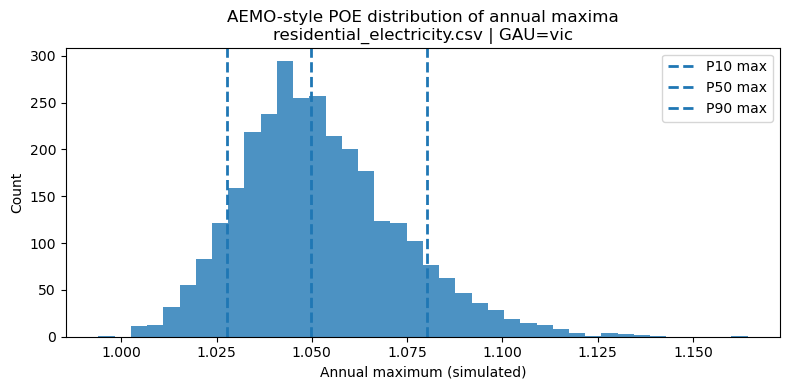


=== residential_electricity.csv | GAU=wa | annual maxima POE ===
Saved: C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\poe_maxima\residential_electricity__wa__annual_maxima.csv
P10 max (1-in-10 high): 1.083930
P50 max (median):       1.053032
P90 max (mild):         1.027993


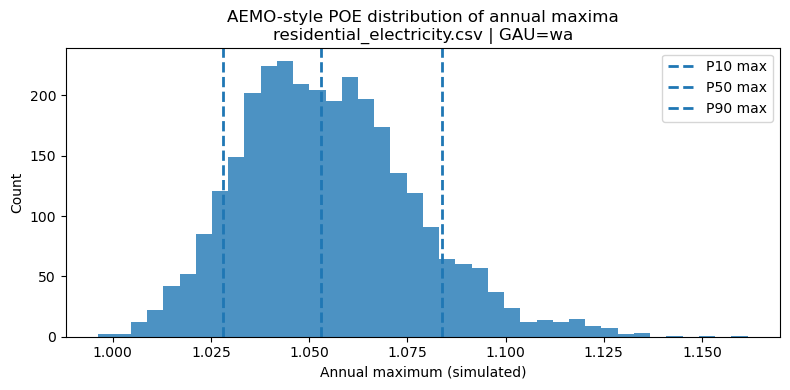

In [ ]:
"""
# CELL 12 - This script computes true AEMO-style Probability of Exceedance (POE) maximum demand
metrics from EnergyPATHWAYS hourly shape data using explicit stochastic simulation.

For each electricity shape file and each GAU:
  • The original hourly demand shape is treated as a reference year.
  • Thousands of synthetic weather-years are generated using a three-step process:
      1) block bootstrapping via a random ±3-day calendar shift,
      2) multiplicative hourly weather variability, and
      3) additive residual noise representing unexplained demand variation.
  • Each synthetic year preserves realistic intra-day and seasonal correlations.

For every simulated year, the script extracts a single extreme value:
  • the annual (or optionally seasonal) maximum hourly demand,
  • along with the timestamp at which that maximum occurs.

The collection of one maximum per simulated year forms a distribution of extreme
demand outcomes. From this distribution, AEMO-consistent POE metrics are computed:
  • P10 = 90th percentile of annual maxima (high-demand, 1-in-10-year level),
  • P50 = median annual maximum,
  • P90 = 10th percentile of annual maxima (mild-demand year).

This approach exactly matches AEMO’s definition of POE for maximum demand, where
probabilities are defined over years (or seasons), not individual hours.

Key distinction from POE shape generation:
  • This script preserves joint temporal structure by extracting one extreme per
    simulated year.
  • POE maxima cannot be inferred from pointwise hourly POE shapes, because
    percentiles and maxima do not commute.
  • Re-simulation is therefore required to obtain valid AEMO-style POE maxima.

The outputs are intended for:
  • alignment with AEMO’s forecasting methodology,
  • validation against published P10/P50/P90 maximum demand forecasts,
  • stress-testing infrastructure against extreme demand events,
  • and downstream analysis linking peak magnitude to timing and weather conditions.
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

shape_dir = r"C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData"
out_dir   = os.path.join(shape_dir, "poe_maxima")
os.makedirs(out_dir, exist_ok=True)

# --------------------------
# PARAMETERS (match your simulation)
# --------------------------
N_SIM = 3000
DAY_SHIFT_MAX = 3
MUL_SIGMA = 0.04
RESIDUAL_SIGMA = 0.01
RANDOM_SEED = 42   # set to None if you want different results each run

rng = np.random.default_rng(RANDOM_SEED)

def simulate_year(ref_values):
    """One synthetic year (hourly) from your three-step recipe."""
    H = len(ref_values)

    # 1) day shift
    shift_days = rng.integers(-DAY_SHIFT_MAX, DAY_SHIFT_MAX + 1)
    shift = int(shift_days * 24)
    shifted = np.roll(ref_values, shift)

    # 2) multiplicative weather variability
    mul = rng.normal(1.0, MUL_SIGMA, H)
    weathered = shifted * mul

    # 3) additive residual
    eps = rng.normal(0.0, RESIDUAL_SIGMA, H)
    syn = weathered + eps

    return syn

def extract_poe_maxima(df, gau, season=None):
    """
    Returns AEMO-style POE maxima distribution for a GAU.
    season: None (annual), or one of {"DJF","MAM","JJA","SON"} to do seasonal maxima.
    """
    sub = df[df["gau"] == gau].copy().sort_values("weather_datetime")
    t = pd.to_datetime(sub["weather_datetime"])
    y = sub["value"].to_numpy()
    H = len(y)

    if season is not None:
        month = t.dt.month.to_numpy()
        if season == "DJF":
            mask = np.isin(month, [12, 1, 2])
        elif season == "MAM":
            mask = np.isin(month, [3, 4, 5])
        elif season == "JJA":
            mask = np.isin(month, [6, 7, 8])
        elif season == "SON":
            mask = np.isin(month, [9, 10, 11])
        else:
            raise ValueError("season must be None or one of DJF/MAM/JJA/SON")
    else:
        mask = np.ones(H, dtype=bool)

    maxima = np.empty(N_SIM, dtype=float)
    max_time = np.empty(N_SIM, dtype="datetime64[ns]")

    # simulate many years and extract ONE max per simulation (AEMO-style)
    for i in range(N_SIM):
        syn = simulate_year(y)

        syn_season = syn[mask]
        t_season = t.to_numpy()[mask]

        j = int(np.argmax(syn_season))
        maxima[i] = syn_season[j]
        max_time[i] = t_season[j]

    # AEMO-style: percentiles of the maxima distribution
    # For maxima: P10 is 90th percentile, P50 is 50th, P90 is 10th
    p10 = np.percentile(maxima, 90)
    p50 = np.percentile(maxima, 50)
    p90 = np.percentile(maxima, 10)

    return maxima, max_time, p10, p50, p90

# --------------------------
# PROCESS ALL ELECTRICITY SHAPE FILES
# --------------------------
shape_files = [
    f for f in os.listdir(shape_dir)
    if f.endswith(".csv") and "electricity" in f.lower()
]

print("Writing AEMO-style maxima POE outputs to:", out_dir)
print("\nProcessing:")
for f in shape_files:
    print(" •", f)

for file in shape_files:
    path = os.path.join(shape_dir, file)
    df = pd.read_csv(path)

    if "weather_datetime" not in df.columns:
        print(f"\nSkipping {file} (not a datetime shape file).")
        continue

    df["weather_datetime"] = pd.to_datetime(df["weather_datetime"])
    if "gau" not in df.columns:
        df["gau"] = "all"

    for gau in df["gau"].unique():
        print(f"\n=== {file} | GAU={gau} | annual maxima POE ===")

        maxima, max_time, P10, P50, P90 = extract_poe_maxima(df, gau, season=None)

        # Save distribution
        out_df = pd.DataFrame({
            "file": file,
            "gau": gau,
            "sim_id": np.arange(N_SIM),
            "annual_max": maxima,
            "time_of_max": pd.to_datetime(max_time)
        })

        out_path = os.path.join(out_dir, file.replace(".csv", f"__{gau}__annual_maxima.csv"))
        out_df.to_csv(out_path, index=False)
        print("Saved:", out_path)

        print(f"P10 max (1-in-10 high): {P10:.6f}")
        print(f"P50 max (median):       {P50:.6f}")
        print(f"P90 max (mild):         {P90:.6f}")

        # Plot distribution + POE lines
        plt.figure(figsize=(8,4))
        plt.hist(maxima, bins=40, alpha=0.8)
        plt.axvline(P10, linestyle="--", linewidth=2, label="P10 max")
        plt.axvline(P50, linestyle="--", linewidth=2, label="P50 max")
        plt.axvline(P90, linestyle="--", linewidth=2, label="P90 max")
        plt.title(f"AEMO-style POE distribution of annual maxima\n{file} | GAU={gau}")
        plt.xlabel("Annual maximum (simulated)")
        plt.ylabel("Count")
        plt.legend()
        plt.tight_layout()
        plt.show()


GAUs found: ['nsw' 'nt' 'qld' 'sa' 'tas' 'vic' 'wa']

=== Processing GAU: nsw ===
  Days available: 2922


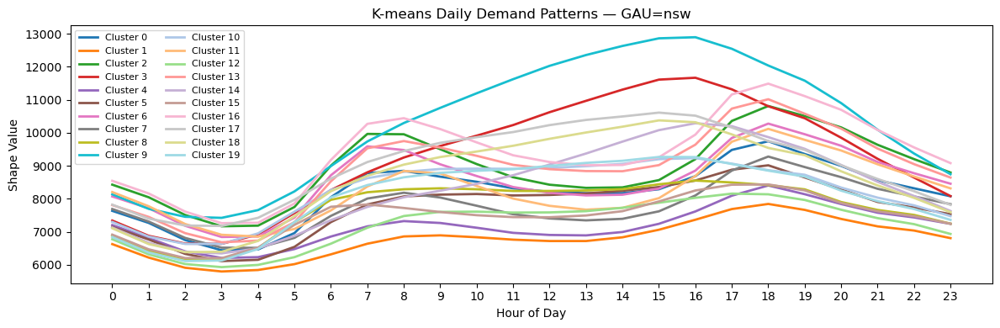


Cluster proportions:
0     0.061602
1     0.067077
2     0.065366
3     0.021903
4     0.060917
5     0.088296
6     0.047228
7     0.065708
8     0.098220
9     0.011636
10    0.036277
11    0.040726
12    0.070157
13    0.033196
14    0.034223
15    0.062286
16    0.035592
17    0.017796
18    0.037303
19    0.044490
Name: cluster, dtype: float64


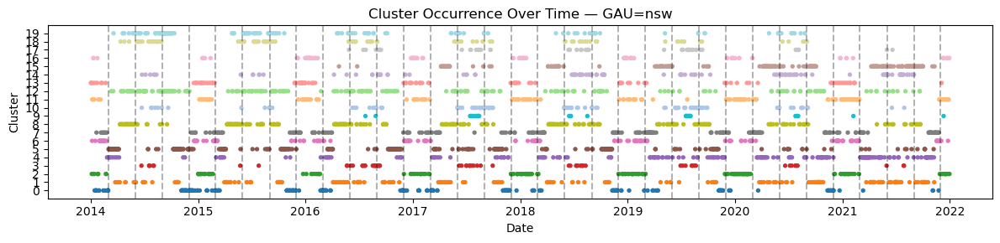


=== Processing GAU: nt ===
  Days available: 2922


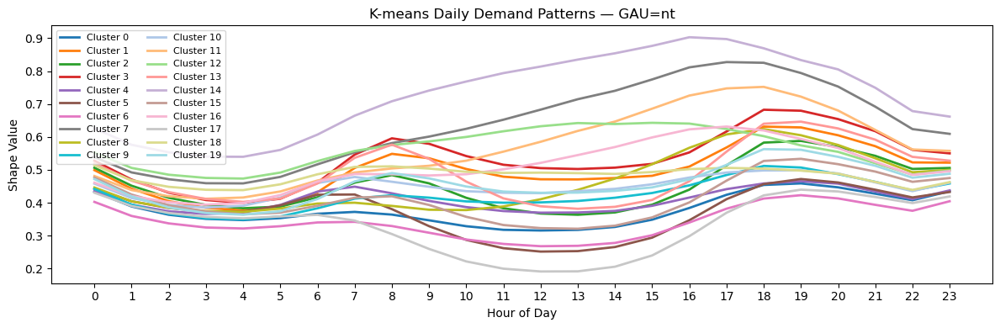


Cluster proportions:
0     0.112252
1     0.079055
2     0.067762
3     0.046201
4     0.094456
5     0.071184
6     0.033881
7     0.017112
8     0.028063
9     0.058179
10    0.082478
11    0.017454
12    0.009582
13    0.037303
14    0.005133
15    0.068104
16    0.033196
17    0.044832
18    0.014031
19    0.079740
Name: cluster, dtype: float64


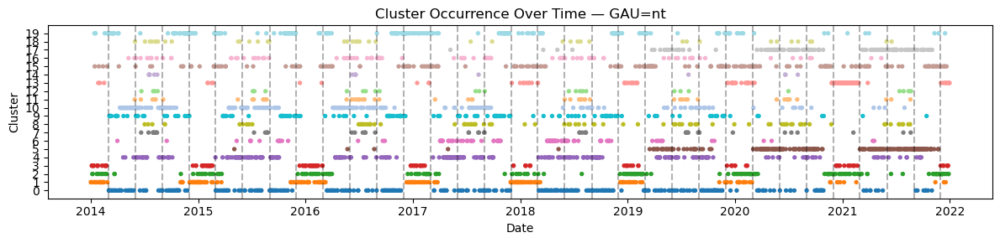


=== Processing GAU: qld ===
  Days available: 2922


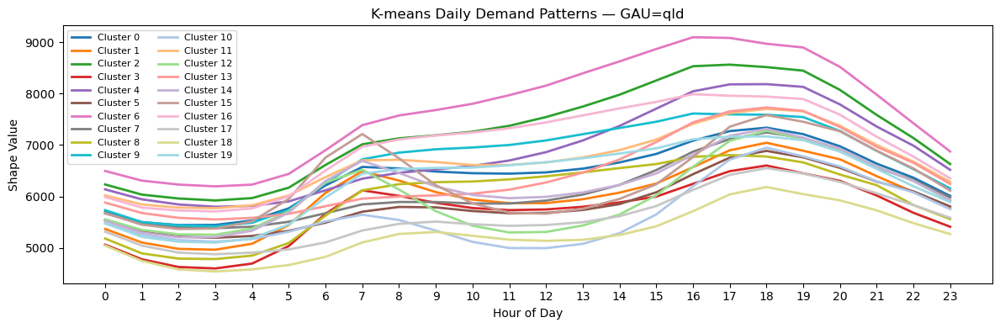


Cluster proportions:
0     0.066735
1     0.060233
2     0.041752
3     0.062286
4     0.039357
5     0.070842
6     0.021561
7     0.056468
8     0.037988
9     0.054757
10    0.060917
11    0.032170
12    0.056126
13    0.039357
14    0.082478
15    0.053046
16    0.045517
17    0.041068
18    0.034565
19    0.042779
Name: cluster, dtype: float64


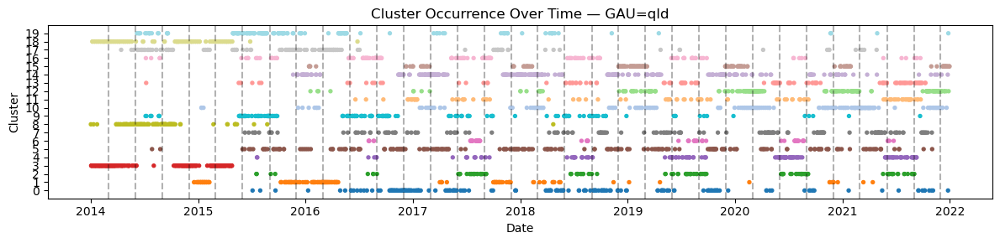


=== Processing GAU: sa ===
  Days available: 2922


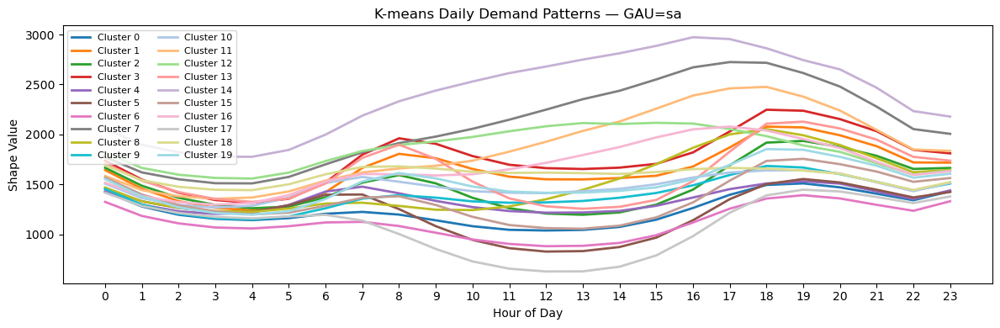


Cluster proportions:
0     0.112252
1     0.079055
2     0.067762
3     0.046201
4     0.094456
5     0.071184
6     0.033881
7     0.017112
8     0.028063
9     0.058179
10    0.082478
11    0.017454
12    0.009582
13    0.037303
14    0.005133
15    0.068104
16    0.033196
17    0.044832
18    0.014031
19    0.079740
Name: cluster, dtype: float64


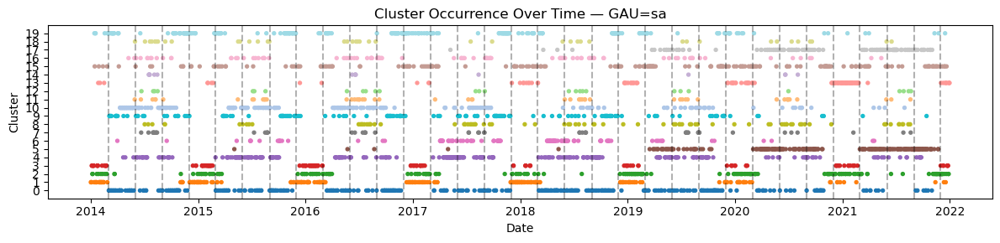


=== Processing GAU: tas ===
  Days available: 2922


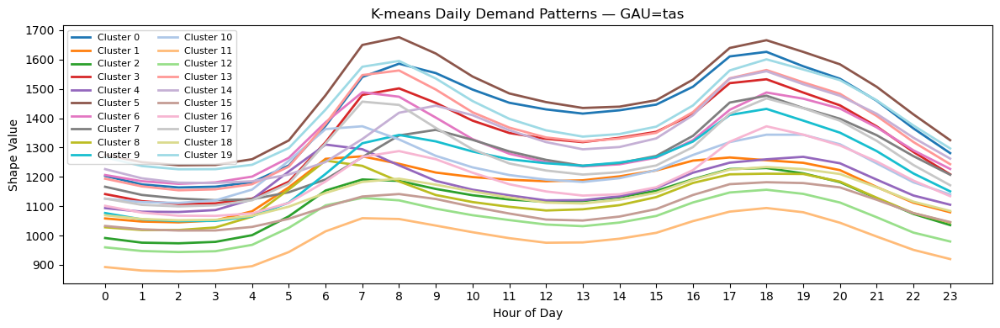


Cluster proportions:
0     0.040383
1     0.083847
2     0.055784
3     0.044490
4     0.056810
5     0.027036
6     0.038672
7     0.040041
8     0.082478
9     0.037988
10    0.052361
11    0.011636
12    0.041410
13    0.052019
14    0.037303
15    0.073238
16    0.052361
17    0.049281
18    0.077687
19    0.045175
Name: cluster, dtype: float64


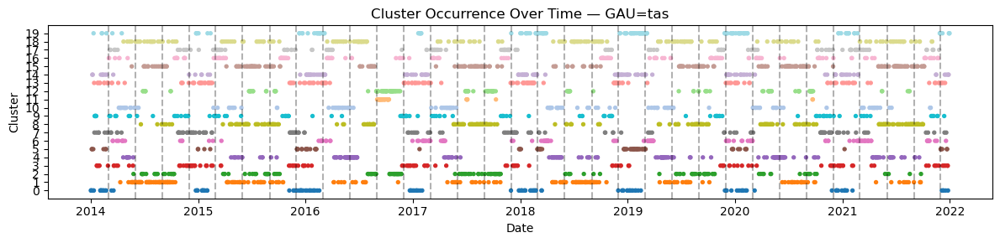


=== Processing GAU: vic ===
  Days available: 2922


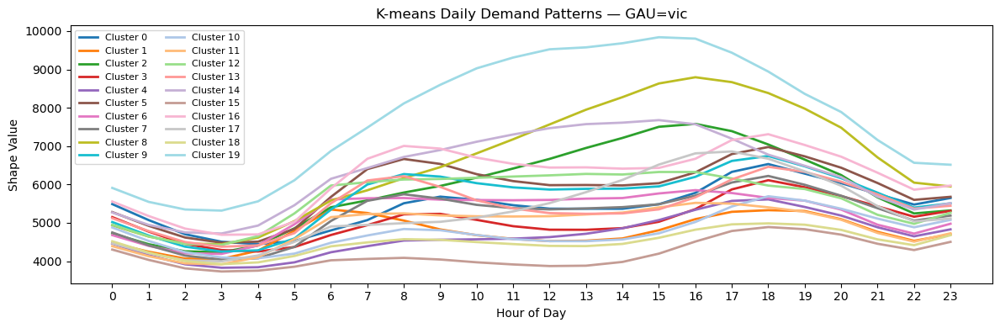


Cluster proportions:
0     0.031828
1     0.064682
2     0.025667
3     0.060575
4     0.043806
5     0.095140
6     0.088638
7     0.059206
8     0.009925
9     0.064339
10    0.060917
11    0.071869
12    0.053730
13    0.043121
14    0.012320
15    0.063997
16    0.056468
17    0.022245
18    0.069131
19    0.002396
Name: cluster, dtype: float64


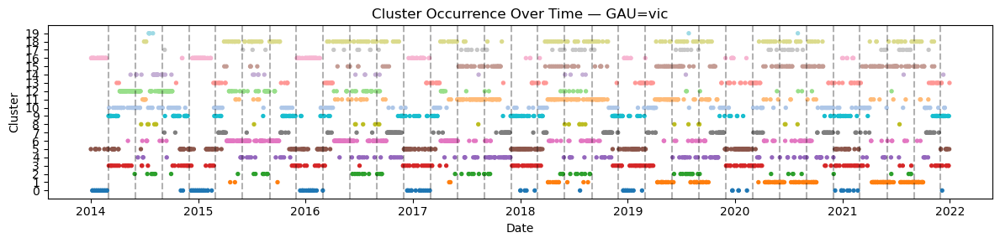


=== Processing GAU: wa ===
  Days available: 2922


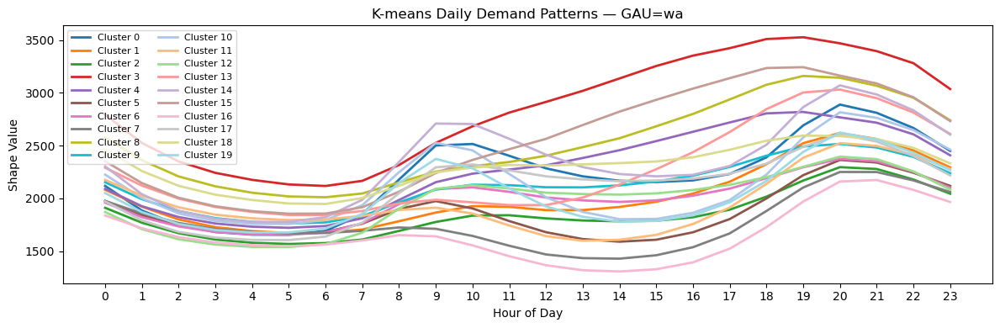


Cluster proportions:
0     0.067420
1     0.057495
2     0.092402
3     0.010609
4     0.040041
5     0.078713
6     0.086927
7     0.055099
8     0.022587
9     0.061259
10    0.041068
11    0.040383
12    0.060233
13    0.024298
14    0.035934
15    0.032512
16    0.037645
17    0.076660
18    0.020534
19    0.058179
Name: cluster, dtype: float64


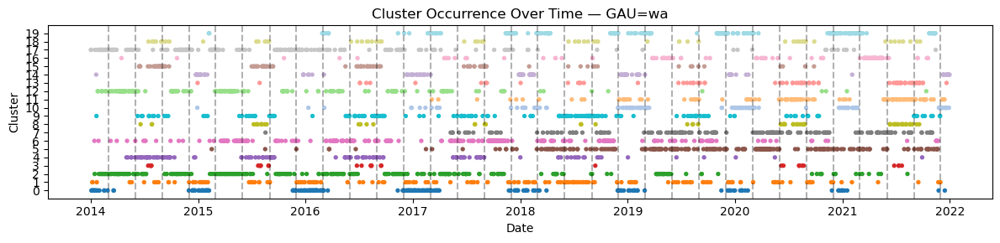

In [ ]:
"""
# CELL 13 - K-means Clustering of Daily Electricity Input Load Shapes by GAU

This script analyses EnergyPATHWAYS electricity shape data by grouping
daily 24-hour input load profiles into characteristic patterns using K-means
clustering. The workflow is applied independently to each GAU
(Geographic Aggregation Unit).

Overview of steps:
1. Load hourly electricity shape data from a CSV file.
2. Parse timestamps and ensure a GAU identifier is present.
3. For each GAU:
   - Reshape hourly data into daily 24-hour vectors.
   - Standardise daily profiles to remove scale effects.
   - Apply K-means clustering to identify representative daily shapes.
4. Visualise results for each GAU:
   - Plot cluster centre load shapes (average daily profiles).
   - Report the proportion of days assigned to each cluster.
   - Plot cluster occurrence over time, with seasonal boundaries marked.
5. Use a fixed random seed and a distinct colour palette to ensure
   reproducible and interpretable clustering and plots.

The output provides insight into recurring daily demand patterns,
their seasonal behaviour, and their relative frequency within each GAU.
"""




import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from matplotlib import colormaps

# --------------------------
# SETTINGS
# --------------------------
shape_file = r"C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\bulk_electricity.csv"
n_clusters = 20
kmeans_seed = 42

# --------------------------
# GENERATE DISTINCT CLUSTER COLOURS
# --------------------------
def generate_distinct_colours(n):
    if n > 20:
        raise ValueError("This palette supports up to 20 clusters.")

    base = np.array(colormaps["tab20"].colors)
    order = np.concatenate([
        np.arange(0, 20, 2),
        np.arange(1, 20, 2)
    ])
    return base[order][:n]

cluster_colours = generate_distinct_colours(n_clusters)

# --------------------------
# SEASON LINE HELPER
# --------------------------
def add_season_lines(ax, dates):
    years = sorted({d.year for d in dates})
    for y in years:
        for month in [3, 6, 9, 12]:  # Mar, Jun, Sep, Dec
            date = pd.Timestamp(year=y, month=month, day=1)
            if dates.min() <= date <= dates.max():
                ax.axvline(date, color="k", linestyle="--", alpha=0.3)

# --------------------------
# LOAD DATA
# --------------------------
df = pd.read_csv(shape_file)

if "weather_datetime" not in df.columns:
    raise ValueError("File does not contain weather_datetime column.")

df["weather_datetime"] = pd.to_datetime(df["weather_datetime"])

if "gau" not in df.columns:
    df["gau"] = "all"

all_gaus = df["gau"].unique()
print("GAUs found:", all_gaus)

# =========================================================
# PROCESS EACH GAU
# =========================================================
for gau in all_gaus:

    print(f"\n=== Processing GAU: {gau} ===")

    sub = df[df["gau"] == gau].copy()
    sub = sub.sort_values("weather_datetime")

    sub["date"] = sub["weather_datetime"].dt.date
    sub["hour"] = sub["weather_datetime"].dt.hour

    daily = sub.pivot_table(
        index="date",
        columns="hour",
        values="value"
    ).dropna()

    daily.index = pd.to_datetime(daily.index)
    print(f"  Days available: {len(daily)}")

    scaler = StandardScaler()
    X = scaler.fit_transform(daily.values)

    kmeans = KMeans(
        n_clusters=n_clusters,
        n_init=20,
        random_state=kmeans_seed
    )
    labels = kmeans.fit_predict(X)

    daily["cluster"] = labels
    centres = scaler.inverse_transform(kmeans.cluster_centers_)

    # --------------------------
    # CLUSTER CENTRES
    # --------------------------
    plt.figure(figsize=(12, 4))
    for c in range(n_clusters):
        plt.plot(
            range(24),
            centres[c],
            color=cluster_colours[c],
            linewidth=2,
            label=f"Cluster {c}"
        )

    plt.title(f"K-means Daily Demand Patterns — GAU={gau}")
    plt.xlabel("Hour of Day")
    plt.ylabel("Shape Value")
    plt.xticks(range(24))
    plt.legend(ncol=2, fontsize=8)
    plt.tight_layout()
    plt.show()

    # --------------------------
    # CLUSTER PROPORTIONS
    # --------------------------
    print("\nCluster proportions:")
    print(daily["cluster"].value_counts(normalize=True).sort_index())

    # --------------------------
    # CLUSTER OCCURRENCE OVER TIME (WITH SEASONS)
    # --------------------------
    fig, ax = plt.subplots(figsize=(12, 3))
    ax.scatter(
        daily.index,
        daily["cluster"],
        c=[cluster_colours[c] for c in daily["cluster"]],
        s=8
    )

    add_season_lines(ax, daily.index)

    ax.set_title(f"Cluster Occurrence Over Time — GAU={gau}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Cluster")
    ax.set_yticks(range(n_clusters))
    plt.tight_layout()
    plt.show()


Loading EP electricity profiles...
Aggregating subsectors to total electricity demand...

Computed load factor metrics:


,region,scenario,year,annual_energy_GJ,avg_hourly_GJ,peak_hourly_GJ,load_factor
0,ex-nsw,REFERENCE,2021,0.0,0.0,0.0,NaN
1,ex-nsw,REFERENCE,2030,0.0,0.0,0.0,NaN
2,ex-nsw,REFERENCE,2040,0.0,0.0,0.0,NaN
3,ex-nsw,REFERENCE,2050,0.0,0.0,0.0,NaN
4,ex-nsw,REFERENCE,2060,0.0,0.0,0.0,NaN



Plotting load factor evolution...


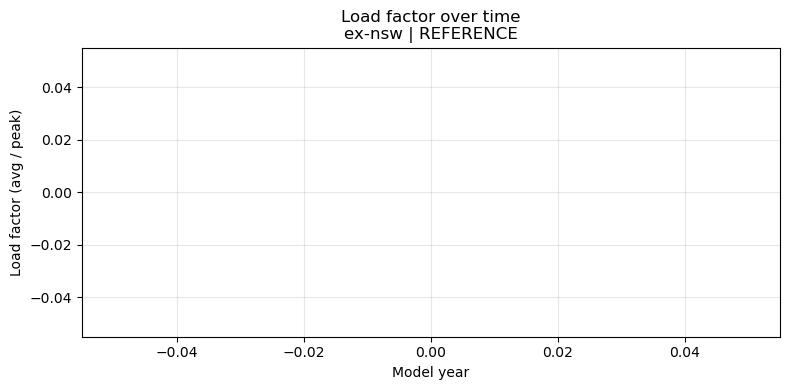

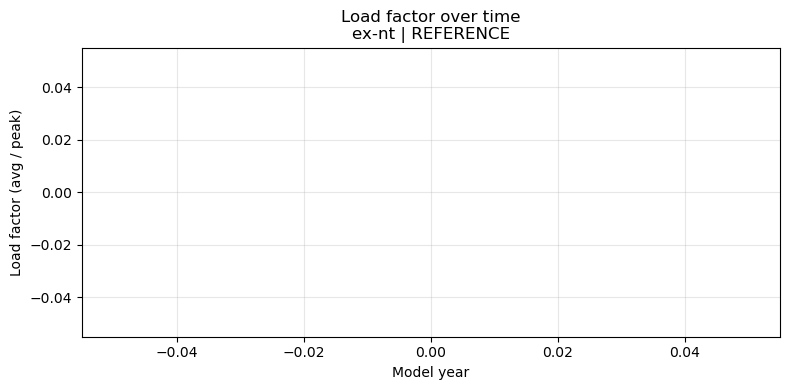

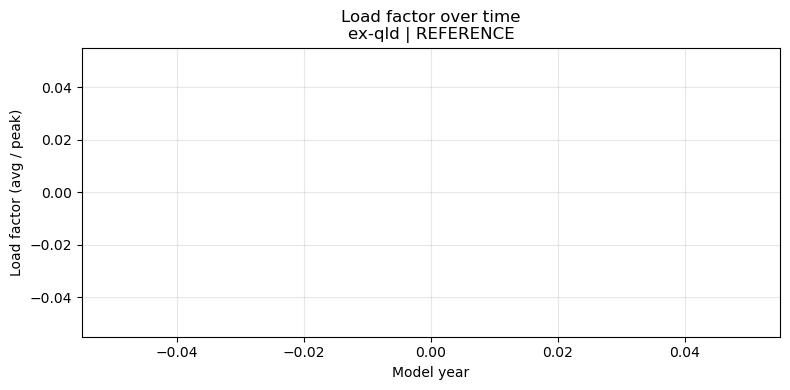

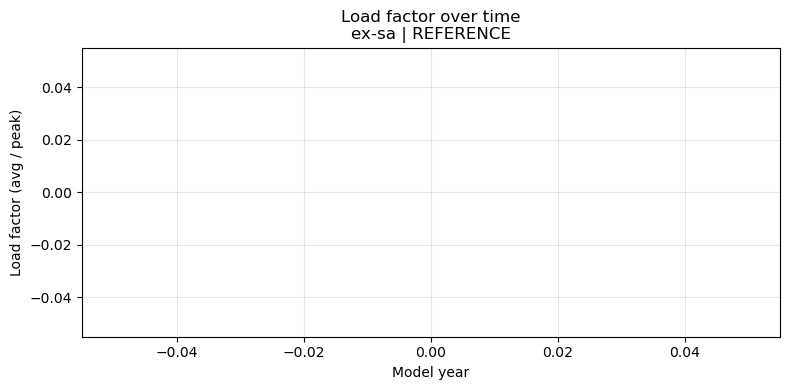

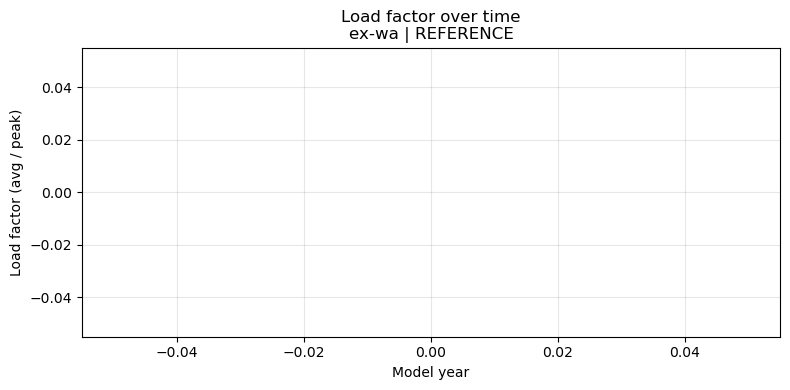

...

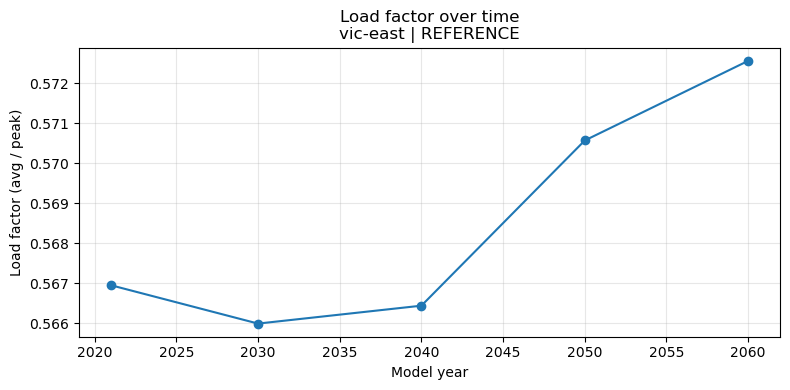

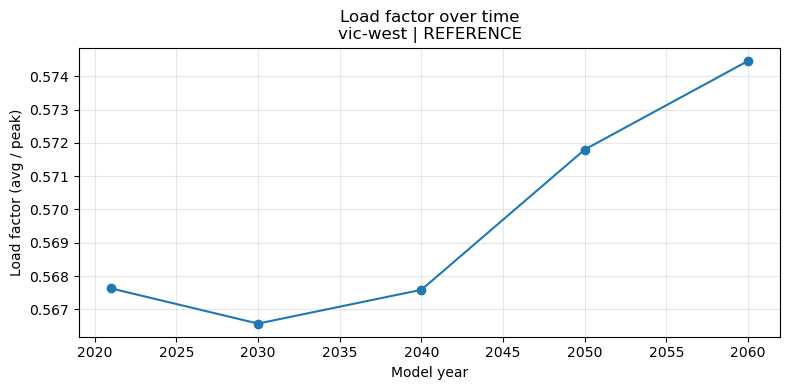

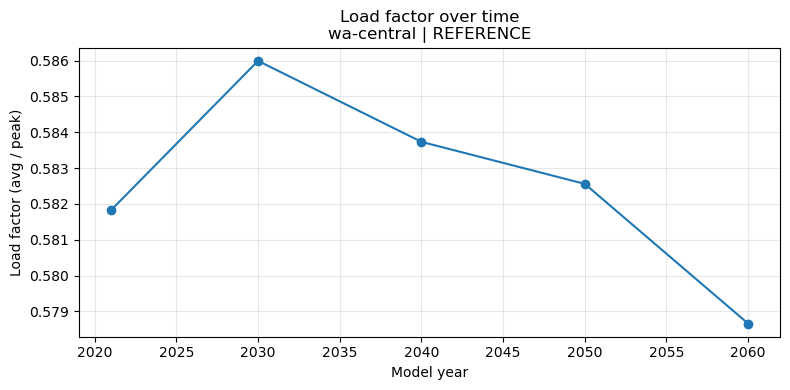

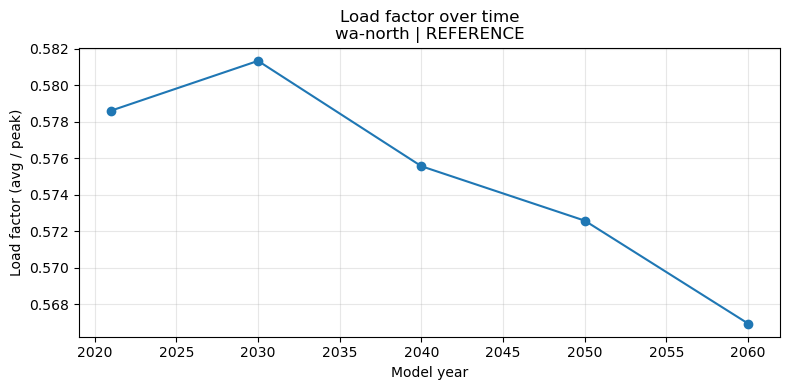

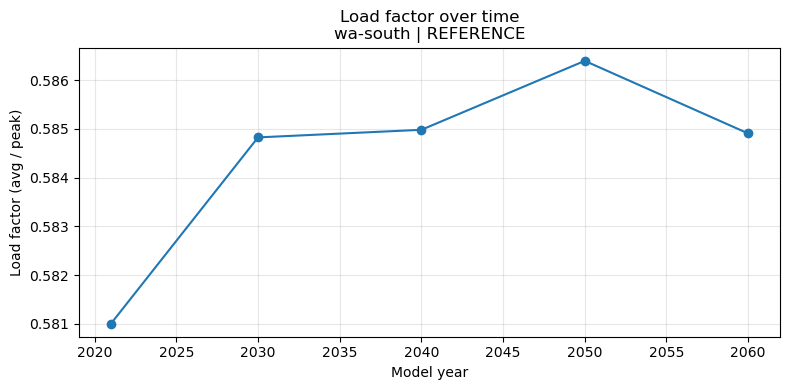

In [ ]:
"""
# CELL 14 - Load Factor Analysis of EnergyPATHWAYS Electricity Demand

This cell analyses hourly electricity demand outputs from EnergyPATHWAYS
to quantify and visualise how system load factor evolves over time.

Workflow summary:
1. Load subsector-level hourly electricity demand profiles and parse
   timestamps.
2. Aggregate all electricity subsectors into total hourly electricity
   demand by region, scenario, year, and datetime.
3. For each region–scenario–year combination:
   - Compute total annual energy (GJ/year).
   - Compute average hourly demand.
   - Identify peak hourly demand.
   - Calculate load factor as average hourly demand divided by peak
     hourly demand.
4. Compile load factor metrics into a summary table for inspection.
5. Plot load factor trajectories over model years for each region and
   scenario to show changes in utilisation of peak capacity over time.

The results provide a concise indicator of system utilisation and
demand-shape evolution across scenarios and regions.
"""


import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# INPUT
# ============================================================
EP_FILE = r"C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario\reference\demand_outputs\subsector_electricity_profiles.csv.gz"

print("Loading EP electricity profiles...")
df = pd.read_csv(EP_FILE)

df["WEATHER_DATETIME"] = pd.to_datetime(df["WEATHER_DATETIME"])

# ============================================================
# AGGREGATE TO TOTAL ELECTRICITY (ALL SUBSECTORS)
# ============================================================
print("Aggregating subsectors to total electricity demand...")

agg = (
    df.groupby(
        ["NZAU-GEOGRAPHY", "SCENARIO", "YEAR", "WEATHER_DATETIME"],
        as_index=False
    )["GIGAJOULE"]
    .sum()
)

# ============================================================
# COMPUTE LOAD FACTOR METRICS
# ============================================================
records = []

for (region, scenario, year), sub in agg.groupby(
    ["NZAU-GEOGRAPHY", "SCENARIO", "YEAR"]
):
    hourly = sub["GIGAJOULE"].values

    annual_energy = hourly.sum()                  # GJ/year
    avg_hourly    = annual_energy / len(hourly)  # GJ/h
    peak_hourly   = hourly.max()                  # GJ/h
    load_factor   = avg_hourly / peak_hourly

    records.append({
        "region": region,
        "scenario": scenario,
        "year": year,
        "annual_energy_GJ": annual_energy,
        "avg_hourly_GJ": avg_hourly,
        "peak_hourly_GJ": peak_hourly,
        "load_factor": load_factor,
    })

lf = pd.DataFrame(records)

print("\nComputed load factor metrics:")
display(lf.head())

# ============================================================
# PLOT: LOAD FACTOR TRAJECTORY
# ============================================================
print("\nPlotting load factor evolution...")

for (region, scenario), sub in lf.groupby(["region", "scenario"]):
    sub = sub.sort_values("year")

    plt.figure(figsize=(8,4))
    plt.plot(sub["year"], sub["load_factor"], marker="o")

    plt.title(f"Load factor over time\n{region} | {scenario}")
    plt.xlabel("Model year")
    plt.ylabel("Load factor (avg / peak)")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


In [2]:
"""
REPLACE EP HOURLY SHAPE APPLICATION (DIAGNOSTIC)

This cell reconstructs hourly subsector electricity demand by explicitly
applying input shapes to annual EP electricity demand.

It bypasses EP's internal hourly allocation logic entirely and is intended
to diagnose shape misalignment or incorrect application.
"""

import pandas as pd
import numpy as np

# ------------------------------------------------------------
# INPUT FILES
# ------------------------------------------------------------
ANNUAL_FILE = r"C:\EP_model_2025\EnergyPATHWAYS\ep_runs\my_scenario\reference\demand_outputs\d_energy.csv.gz"
SHAPE_FILE  = r"C:\EP_model_2025\EnergyPATHWAYS\ep_db\ShapeData\bulk_electricity.csv"

# ------------------------------------------------------------
# PARAMETERS (EDIT AS NEEDED)
# ------------------------------------------------------------
REGION    = "nsw-north"
SUBSECTOR = "residential lighting"
YEAR      = 2021
SCENARIO  = "REFERENCE"

# ------------------------------------------------------------
# LOAD ANNUAL ELECTRICITY DEMAND
# ------------------------------------------------------------
ann = pd.read_csv(ANNUAL_FILE)

ann = ann[
    (ann["FINAL_ENERGY"] == "electricity") &
    (ann["NZAU-GEOGRAPHY"] == REGION) &
    (ann["SUBSECTOR"] == SUBSECTOR) &
    (ann["YEAR"] == YEAR)
]

if len(ann) == 0:
    raise ValueError("No matching annual demand found.")

annual_energy = ann["VALUE"].sum()

# Convert to GJ if required
unit = ann["UNIT"].iloc[0]
if unit.lower().startswith("j"):
    annual_energy /= 1e9  # J → GJ

print(f"Annual electricity demand = {annual_energy:.3f} GJ")

# ------------------------------------------------------------
# LOAD SHAPE
# ------------------------------------------------------------
shape = pd.read_csv(SHAPE_FILE)

if "weather_datetime" not in shape.columns:
    raise ValueError("Shape file must be hourly with weather_datetime.")

shape["weather_datetime"] = pd.to_datetime(shape["weather_datetime"])

# Optional GAU filtering
if "gau" in shape.columns:
    shape = shape[shape["gau"] == REGION]

shape = shape.sort_values("weather_datetime")

# ------------------------------------------------------------
# NORMALISE SHAPE (EXPLICIT, SAFE)
# ------------------------------------------------------------
weights = shape["value"].to_numpy(dtype=float)

if np.any(weights < 0):
    raise ValueError("Shape contains negative values.")

weights /= weights.sum()

print(f"Shape normalisation check: sum(weights) = {weights.sum():.6f}")

# ------------------------------------------------------------
# APPLY SHAPE
# ------------------------------------------------------------
hourly = annual_energy * weights

out = pd.DataFrame({
    "WEATHER_DATETIME": shape["weather_datetime"].values,
    "NZAU-GEOGRAPHY": REGION,
    "SUBSECTOR": SUBSECTOR,
    "YEAR": YEAR,
    "SCENARIO": SCENARIO,
    "GIGAJOULE": hourly
})

# ------------------------------------------------------------
# SANITY CHECKS
# ------------------------------------------------------------
print("\nSanity checks:")
print("Hourly rows:", len(out))
print("Hourly sum (GJ):", out["GIGAJOULE"].sum())
print("Difference from annual (GJ):",
      out["GIGAJOULE"].sum() - annual_energy)

display(out.head())


Annual electricity demand = 1146022.748 GJ
Shape normalisation check: sum(weights) = 0.000000

Sanity checks:
Hourly rows: 0
Hourly sum (GJ): 0.0
Difference from annual (GJ): -1146022.7475985875


,WEATHER_DATETIME,NZAU-GEOGRAPHY,SUBSECTOR,YEAR,SCENARIO,GIGAJOULE
